In [1]:
import numpy as np
import pandas as pd
import scipy.stats as st
import networkx as nx
import scipy as sp 
import matplotlib.pyplot as plt
plt.rcParams["figure.dpi"] = 300
import seaborn as sns
import os
import matplotlib.cm as cm

import hickle


import sys
sys.path.append('/Users/LAPT0084/Documents/PhD/Objective 4 -  Integration through schools/DOS_code/School_Network_Analysis')

import vaccination as vacc
import vaccination as iv
import models
import transnet
import data_loader as dl
import plotting as pl


%matplotlib inline

/Users/LAPT0084/anaconda/lib/python2.7/site-packages/seaborn/apionly.py:9: UserWarning: As seaborn no longer sets a default style on import, the seaborn.apionly module is deprecated. It will be removed in a future version.
  warnings.warn(msg, UserWarning)
/Users/LAPT0084/anaconda/lib/python2.7/site-packages/pandas/core/computation/check.py:17: UserWarning: The installed version of numexpr 2.4.4 is not supported in pandas and will be not be used
The minimum supported version is 2.4.6

  ver=ver, min_ver=_MIN_NUMEXPR_VERSION), UserWarning)


NameError: name 'transnet' is not defined

In [2]:
vacc_dict_sample = vacc.vacc_sample_dict()


In [3]:
vaccframes = [pd.DataFrame.from_dict(vacc_dict_sample['sample ' + str(n)], orient='index', 
                        columns=['vacc ' + str(n)]).convert_objects(convert_numeric=True) for n in range(0,100)]



/Users/LAPT0084/anaconda/lib/python2.7/site-packages/ipykernel_launcher.py:2: FutureWarning: convert_objects is deprecated.  To re-infer data dtypes for object columns, use DataFrame.infer_objects()
For all other conversions use the data-type specific converters pd.to_datetime, pd.to_timedelta and pd.to_numeric.
  


In [4]:
vacc_frame = pd.concat(vaccframes, axis=1)


In [5]:
vacc_frame['median'] = vacc_frame.median(axis=1)
vacc_frame['p25'] = [st.scoreatpercentile(vacc_frame.loc[i], 25) for i in vacc_frame.index]
vacc_frame['p75'] = [st.scoreatpercentile(vacc_frame.loc[i], 75) for i in vacc_frame.index]



In [6]:
vacc_frame = vacc_frame.sort_values(by='median')



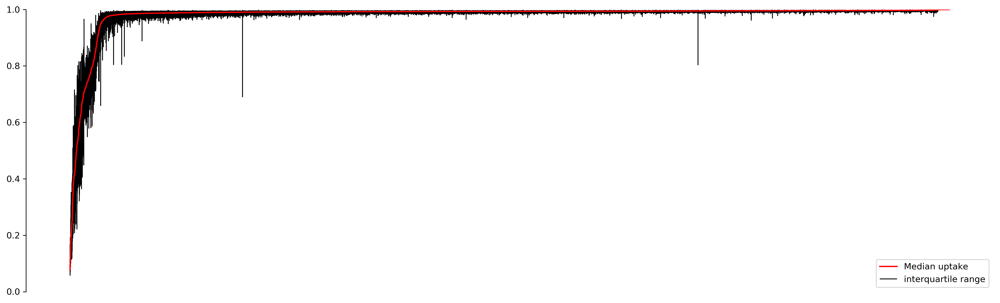

In [7]:
fig=plt.figure(dpi=300)
ax = vacc_frame.plot(y='median', c='r', figsize=[20, 6], ax=fig.gca())
plt.vlines(x=range(len(vacc_frame)),ymin=vacc_frame.p25, ymax=vacc_frame.p75 , alpha=1., linewidth=1.)
#plt.xscale('log')

plt.legend(['Median uptake', 'interquartile range'], loc=4)
plt.ylim([0,1])
plt.xticks([])

ax.spines['top'].set_visible(False)
ax.spines['bottom'].set_visible(False)
ax.spines['right'].set_visible(False)
    

In [8]:
schools_data = dl.load_schools_data()


In [9]:
Reformed_BRIN = schools_data.query('Denomination == "Reformatorisch"').BRIN
Anthro_BRIN = schools_data.query('Denomination == "Antroposofisch"').BRIN
Islamitisch_BRIN = schools_data.query('Denomination == "Islamitisch"').BRIN

In [10]:
pri_BRIN = schools_data.query('kind=="pri"').BRIN
sec_BRIN = schools_data.query('kind=="sec"').BRIN

In [11]:
def plot_vaccup(vacc_frame, schools='ALL', col='r'):
    if isinstance(schools, str):
        print 'all'
    else: 
        vacc_frame = vacc_frame.query('index in @schools')
        print 'selection'

    fig=plt.figure(dpi=300)
    ax = vacc_frame.plot(y='median', c=col, figsize=[20, 6], ax=fig.gca(), style='o', markersize=max(400./len(vacc_frame),2))
    plt.vlines(x=range(len(vacc_frame)),ymin=vacc_frame.p25, ymax=vacc_frame.p75 , alpha=1., linewidth=1.)
    #plt.xscale('log')
    plt.legend(['Median uptake', 'interquartile range'], loc=4)
    plt.ylim([0,1])
    plt.xticks([])
    
    ax.spines['top'].set_visible(False)
    ax.spines['bottom'].set_visible(False)
    ax.spines['right'].set_visible(False)
    
    

selection


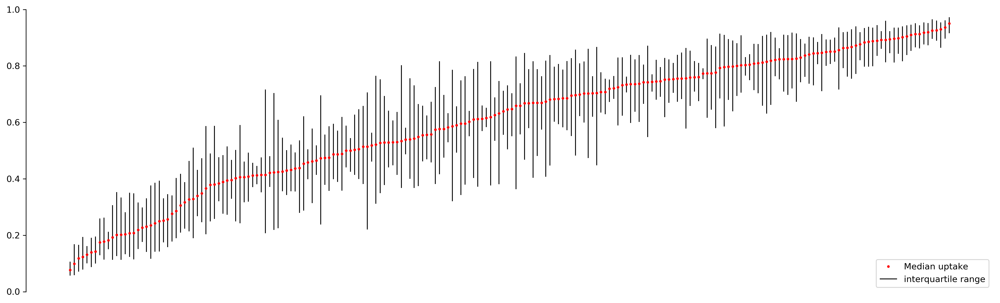

In [12]:
plot_vaccup(vacc_frame, Reformed_BRIN)

selection


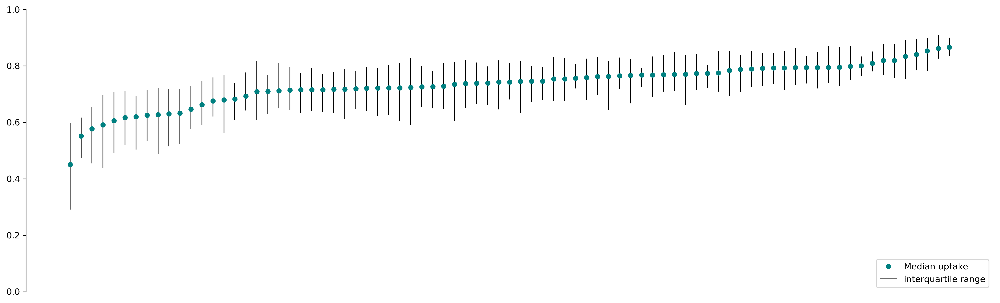

In [13]:
plot_vaccup(vacc_frame, Anthro_BRIN, col='Teal')

selection
selection
selection
selection
selection
selection
selection
selection
selection
selection
selection
selection
selection
selection
selection
selection
selection
selection
selection
selection
selection


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/matplotlib/pyplot.py:522: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


selection
selection
selection
selection
selection
selection


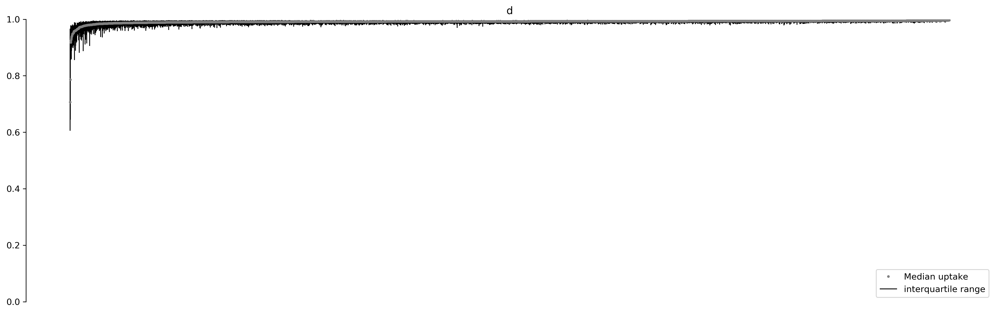

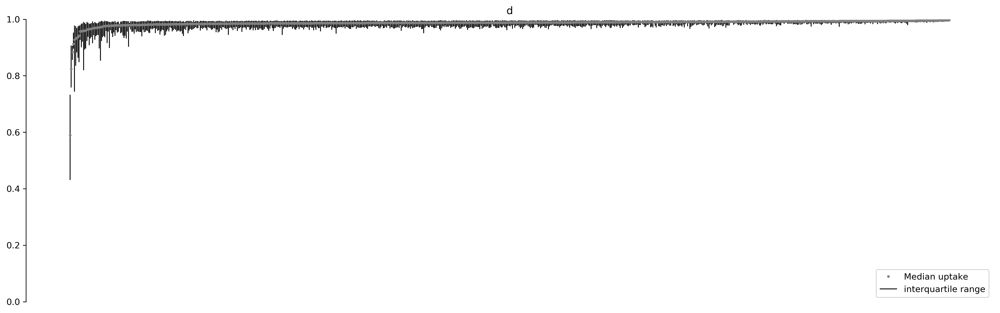

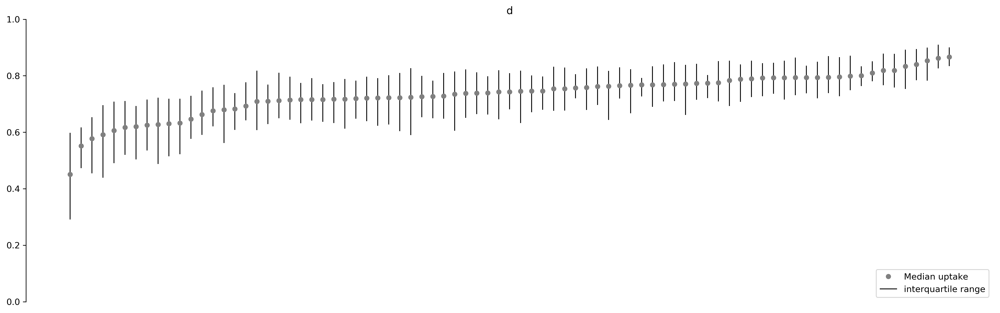

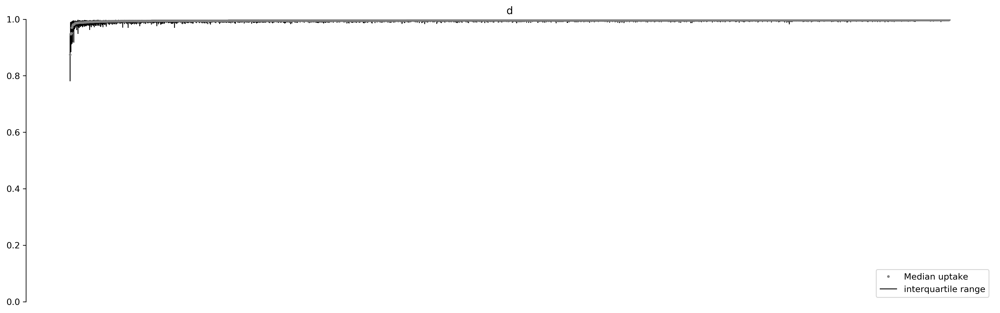

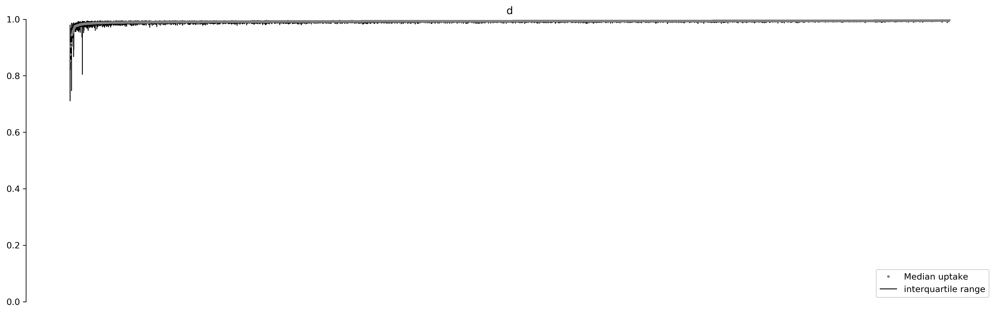

...

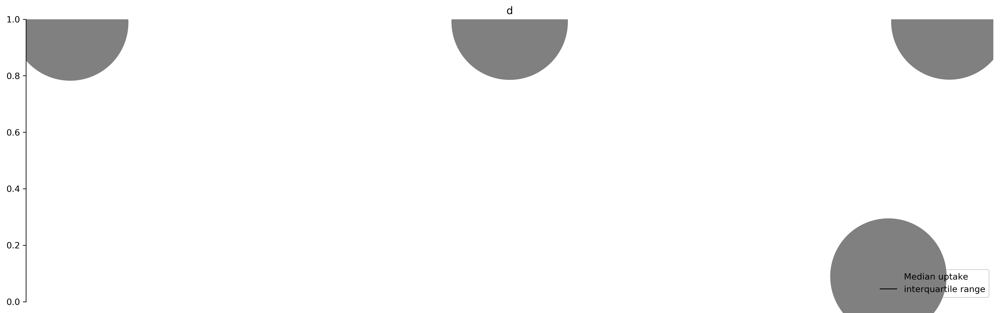

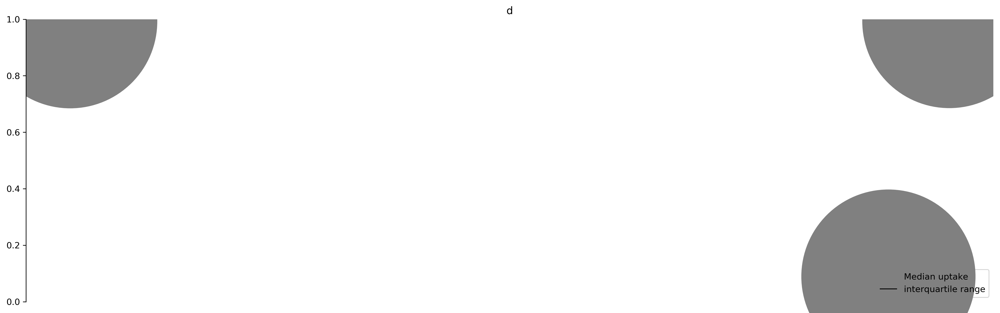

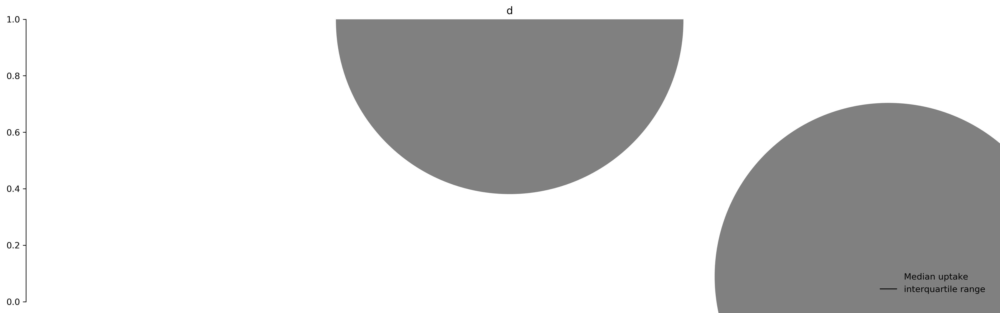

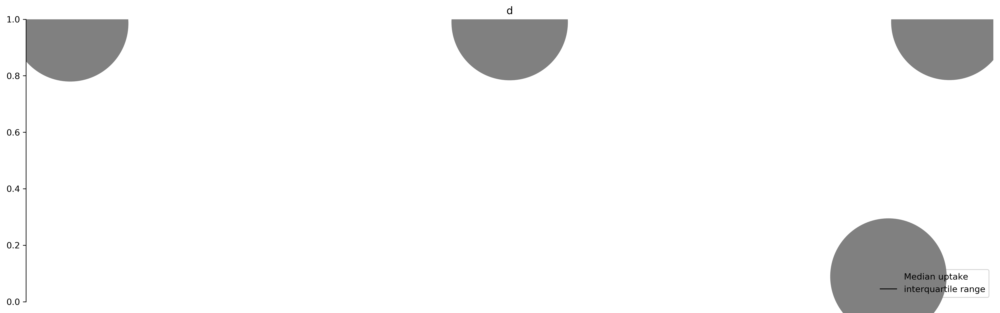

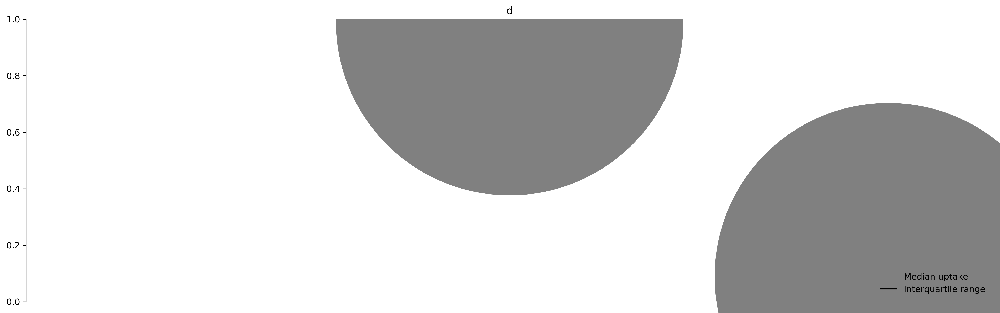

In [15]:
for D in schools_data.Denomination.unique():
    BRINS = schools_data.query('Denomination == @D').BRIN
    plot_vaccup(vacc_frame,BRINS, col='Grey')
    plt.title('d')

In [18]:
transmat = 1.*hickle.load('netres/outbreaks/outbreak_10_0.hkl').todense()
obnet = transnet.create_network_from_transmat(transmat,nodelist=transnet.nodelist)


In [19]:
outdeg = obnet.out_degree()
indeg = obnet.in_degree()
to_keep = [n for n in outdeg if outdeg[n] > 0 or indeg[n] > 0]
only_con = obnet.subgraph(to_keep)

/Users/LAPT0084/anaconda/lib/python2.7/site-packages/networkx/drawing/nx_pylab.py:520: MatplotlibDeprecationWarning: The is_string_like function was deprecated in version 2.1.
  if not cb.is_string_like(edge_color) \
/Users/LAPT0084/anaconda/lib/python2.7/site-packages/networkx/drawing/nx_pylab.py:541: MatplotlibDeprecationWarning: The is_string_like function was deprecated in version 2.1.
  if cb.is_string_like(edge_color) or len(edge_color) == 1:


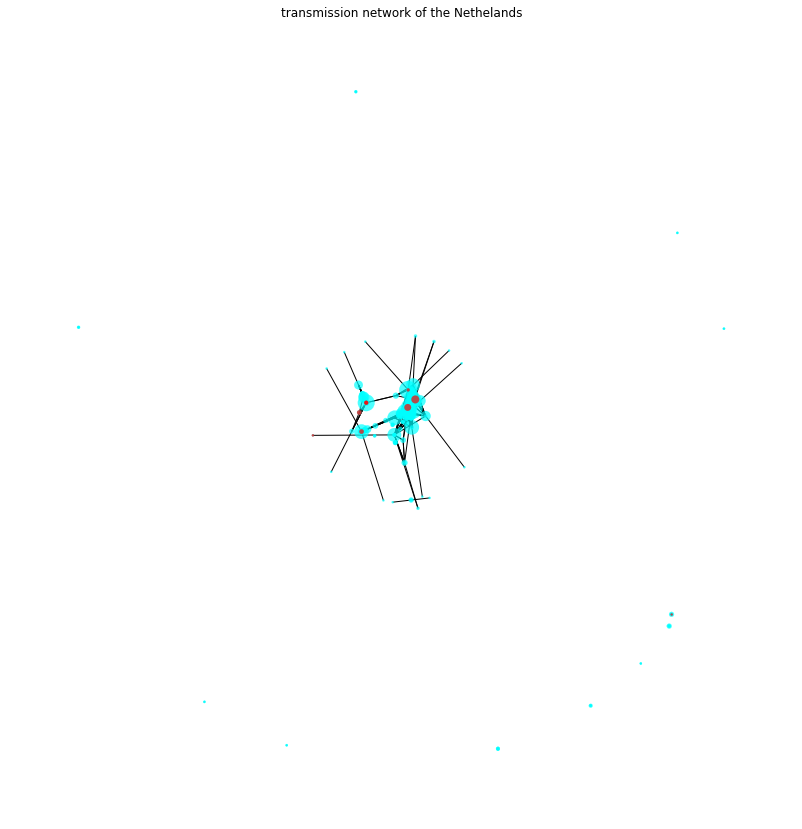

In [20]:
pos = nx.spring_layout(only_con, iterations=10000)
transnet.plot_transnet(only_con,pos=pos,highlight=Reformed_BRIN)

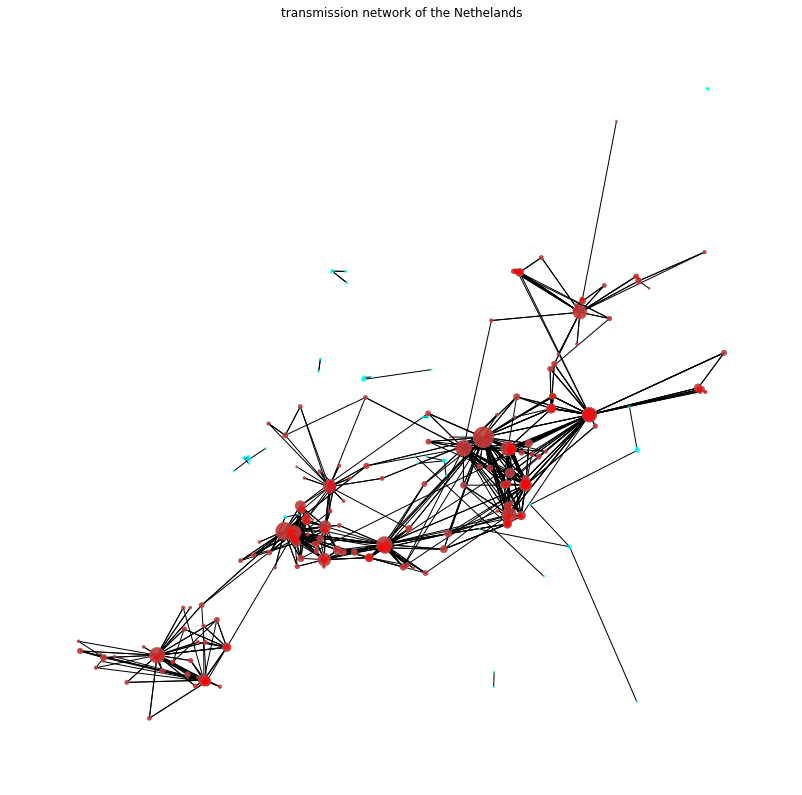

In [45]:
transnet.plot_transnet(only_con.subgraph(nbunch=transnet.nodes),pos=transnet.pos_geo,highlight=Reformed_BRIN)

In [490]:
cons = []
seeds = []
all_keeps = []
for v in range(2,100, 2):
    print v
    for o in range(10): 
        print o
        tm = hickle.load('outbreaks/outbreak_' + str(v) + '_' + str(o) +'.hkl').todense()*1.0
        obnet = transnet.create_network_from_transmat(tm,nodelist=transnet.nodelist)
        outdeg = obnet.out_degree()
        indeg = obnet.in_degree()
        
        all_outcond = [n for n in obnet.nodes() if outdeg[n] > 0]
        all_incond = [n for n in obnet.nodes() if indeg[n] > 0]
        to_keep = list(set(all_outcond + all_incond))
        all_keeps.extend(to_keep)
        all_keeps = list(set(all_keeps))
        
        only_con = obnet.subgraph(to_keep)
        for k in to_keep:
            seeds.append(k)
            con_list = []
            nod_list = [k]
            while len(nod_list) > 0:

                con_list.extend(nod_list)
                nod_list = list(np.hstack([obnet.predecessors(n) for n in nod_list]))
                nod_list = [n for n in nod_list if n not in con_list]
            np.save('cons/' + k + '_con_' + str(v) + '_' + str(o) + '.npy', np.array(list(set(con_list))))
            i+=1
            cons.append(set(con_list))
    

2
0
1
2
3
4
5
6
7
8
9
4
0
1
2
3
4
5
6
7
8
9
6
0
1
2
3
4
5
6
7
8
9
8
0
1
2
3
4
5
6
7
8
9
10
0
1
2
3
4
5
6
7
8
9
12
0
1
2
3
4
5
6
7
8
9
14
0
1
2
3
4
5
6
7
8
9
16
0
1
2
3
4
5
6
7
8
9
18
0
1
2
3
4
5
6
7
8
9
20
0
1
2
3
4
5
6
7
8
9
22
0
1
2
3
4
5
6
7
8
9
24
0
1
2
3
4
5
6
7
8
9
26
0
1
2
3
4
5
6
7
8
9
28
0
1
2
3
4
5
6
7
8
9
30
0
1
2
3
4
5
6
7
8
9
32
0
1
2
3
4
5
6
7
8
9
34
0
1
2
3
4
5
6
7
8
9
36
0
1
2
3
4
5
6
7
8
9
38
0
1
2
3
4
5
6
7
8
9
40
0
1
2
3
4
5
6
7
8
9
42
0
1
2
3
4
5
6
7
8
9
44
0
1
2
3
4
5
6
7
8
9
46
0
1
2
3
4
5
6
7
8
9
48
0
1
2
3
4
5
6
7
8
9
50
0
1
2
3
4
5
6
7
8
9
52
0
1
2
3
4
5
6
7
8
9
54
0
1
2
3
4
5
6
7
8
9
56
0
1
2
3
4
5
6
7
8
9
58
0
1
2
3
4
5
6
7
8
9
60
0
1
2
3
4
5
6
7
8
9
62
0
1
2
3
4
5
6
7
8
9
64
0
1
2
3
4
5
6
7
8
9
66
0
1
2
3
4
5
6
7
8
9
68
0
1
2
3
4
5
6
7
8
9
70
0
1
2
3
4
5
6
7
8
9
72
0
1
2
3
4
5
6
7
8
9
74
0
1
2
3
4
5
6
7
8
9
76
0
1
2
3
4
5
6
7
8
9
78
0
1
2
3
4
5
6
7
8
9
80
0
1
2
3
4
5
6
7
8
9
82
0
1
2
3
4
5
6
7
8
9
84
0
1
2
3
4
5
6
7
8
9
86
0
1
2
3
4
5
6
7
8
9
88
0
1
2
3
4
5


In [658]:
cons = []
seeds = []
all_keeps = []
for v in range(0,100, 2):
    print v
    for o in range(10): 
        print o
        tm = hickle.load('spatialres/outbreaks/outbreak_' + str(v) + '_' + str(o) +'.hkl').todense()*1.0
        obnet = transnet.create_network_from_transmat(tm,nodelist=transnet.nodelist)
        outdeg = obnet.out_degree()
        indeg = obnet.in_degree()
        
        all_outcond = [n for n in obnet.nodes() if outdeg[n] > 0]
        all_incond = [n for n in obnet.nodes() if indeg[n] > 0]
        to_keep = list(set(all_outcond + all_incond))
        all_keeps.extend(to_keep)
        all_keeps = list(set(all_keeps))
        
        #only_con = obnet.subgraph(to_keep)
        for k in to_keep:
            seeds.append(k)
            con_list = []
            nod_list = [k]
            while len(nod_list) > 0:

                con_list.extend(nod_list)
                nod_list = list(np.hstack([obnet.predecessors(n) for n in nod_list]))
                nod_list = [n for n in nod_list if n not in con_list]
            np.save('spatialres/cons/' + k + '_con_' + str(v) + '_' + str(o) + '.npy', np.array(list(set(con_list))))
            i+=1
            cons.append(set(con_list))

0
0
1
2
3
4
5
6
7
8
9
2
0
1
2
3
4
5
6
7
8
9
4
0
1
2
3
4
5
6
7
8
9
6
0
1
2
3
4
5
6
7
8
9
8
0
1
2
3
4
5
6
7
8
9
10
0
1
2
3
4
5
6
7
8
9
12
0
1
2
3
4
5
6
7
8
9
14
0
1
2
3
4
5
6
7
8
9
16
0
1
2
3
4
5
6
7
8
9
18
0
1
2
3
4
5
6
7
8
9
20
0
1
2
3
4
5
6
7
8
9
22
0
1
2
3
4
5
6
7
8
9
24
0
1
2
3
4
5
6
7
8
9
26
0
1
2
3
4
5
6
7
8
9
28
0
1
2
3
4
5
6
7
8
9
30
0
1
2
3
4
5
6
7
8
9
32
0
1
2
3
4
5
6
7
8
9
34
0
1
2
3
4
5
6
7
8
9
36
0
1
2
3
4
5
6
7
8
9
38
0
1
2
3
4
5
6
7
8
9
40
0
1
2
3
4
5
6
7
8
9
42
0
1
2
3
4
5
6
7
8
9
44
0
1
2
3
4
5
6
7
8
9
46
0
1
2
3
4
5
6
7
8
9
48
0
1
2
3
4
5
6
7
8
9
50
0
1
2
3
4
5
6
7
8
9
52
0
1
2
3
4
5
6
7
8
9
54
0
1
2
3
4
5
6
7
8
9
56
0
1
2
3
4
5
6
7
8
9
58
0
1
2
3
4
5
6
7
8
9
60
0
1
2
3
4
5
6
7
8
9
62
0
1
2
3
4
5
6
7
8
9
64
0
1
2
3
4
5
6
7
8
9
66
0
1
2
3
4
5
6
7
8
9
68
0
1
2
3
4
5
6
7
8
9
70
0
1
2
3
4
5
6
7
8
9
72
0
1
2
3
4
5
6
7
8
9
74
0
1
2
3
4
5
6
7
8
9
76
0
1
2
3
4
5
6
7
8
9
78
0
1
2
3
4
5
6
7
8
9
80
0
1
2
3
4
5
6
7
8
9
82
0
1
2
3
4
5
6
7
8
9
84
0
1
2
3
4
5
6
7
8
9
86
0
1
2
3
4
5
6

In [59]:
tm = hickle.load('netres/outbreaks/outbreak_' + str(0) + '_' + str(0) +'.hkl').todense()*1.0
obnet = transnet.create_network_from_transmat(tm,nodelist=transnet.nodes)
outdeg = obnet.out_degree()
indeg = obnet.in_degree()

all_outcond = [n for n in obnet.nodes() if outdeg[n] > 0]
all_incond = [n for n in obnet.nodes() if indeg[n] > 0]
to_keep = list(set(all_outcond + all_incond))
all_keeps.extend(to_keep)
all_keeps = list(set(all_keeps))

only_con = obnet.subgraph(to_keep)

NameError: name 'all_keeps' is not defined

In [60]:
tm = hickle.load('netres/transmats/transmat_' + str(0) +'.hkl').todense()*1.0

In [702]:
tm.sum()

985.3809557438542

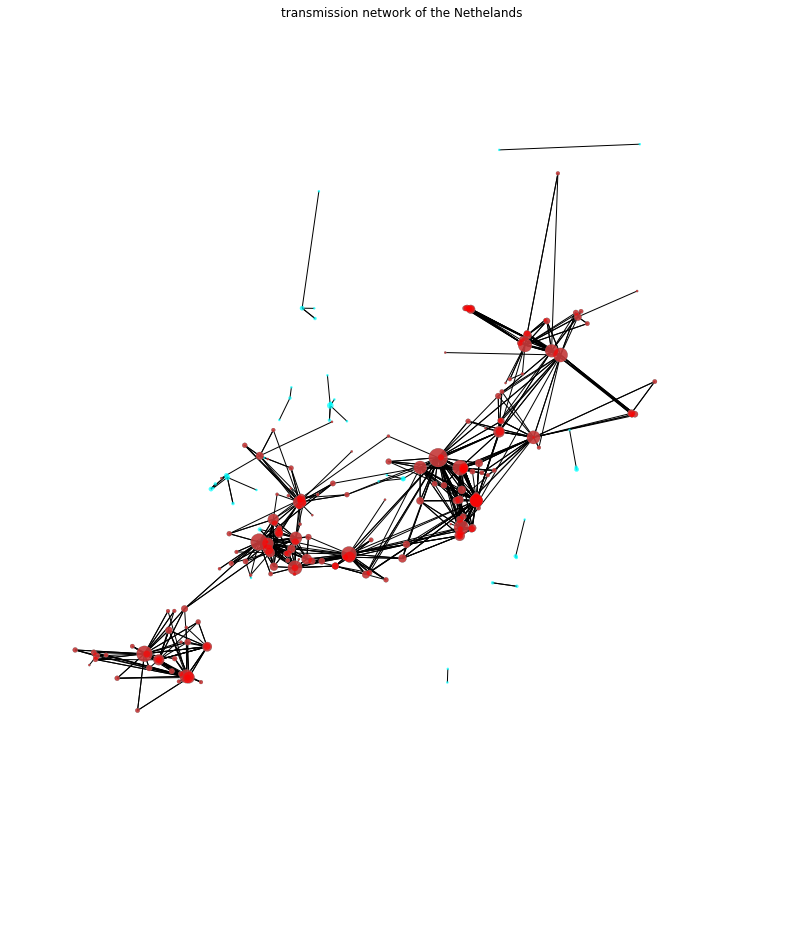

In [708]:
transnet.plot_transnet(obnet.subgraph(nbunch=transnet.nodes),pos=transnet.pos_geo,highlight=Reformed_BRIN)

/Users/LAPT0084/anaconda/lib/python2.7/site-packages/networkx/drawing/nx_pylab.py:520: MatplotlibDeprecationWarning: The is_string_like function was deprecated in version 2.1.
  if not cb.is_string_like(edge_color) \
/Users/LAPT0084/anaconda/lib/python2.7/site-packages/networkx/drawing/nx_pylab.py:541: MatplotlibDeprecationWarning: The is_string_like function was deprecated in version 2.1.
  if cb.is_string_like(edge_color) or len(edge_color) == 1:


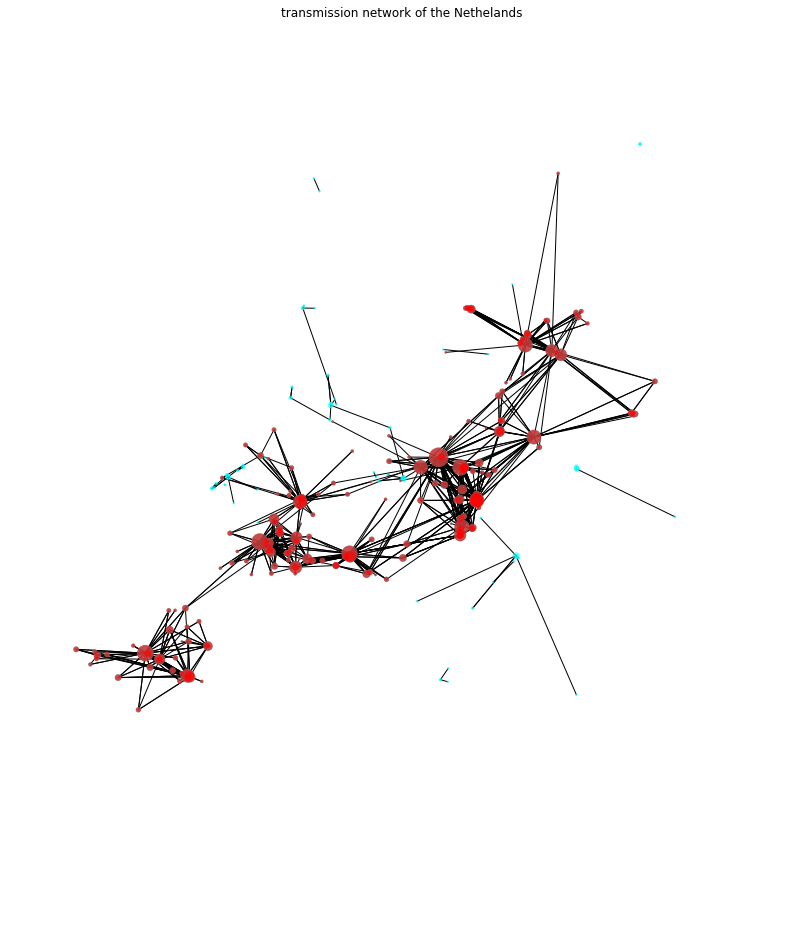

In [61]:
transnet.plot_transnet(obnet.subgraph(nbunch=transnet.nodes),pos=transnet.pos_geo,highlight=Reformed_BRIN)

In [21]:
len(cons)


NameError: name 'cons' is not defined

In [465]:
i = 0
for v in range(0,100,2):
    for o in range(10):
        
        np.save('cons/' + seeds[i] + '_con_' + str(v) + '_' + str(o) + '.npy', np.array(list(cons[i])))
        i+=1
        

In [22]:
i = 0
loaded_cons = []
loaded_seeds = []
loaded_vacc = []
dirlist = os.listdir('netres/succ')
for f in dirlist:
    if 'DS_Store' not in f:
        loaded_cons.append(list(np.load('netres/succ/' + f)))
        loaded_seeds.append(f[:6])
        loaded_vacc.append(f[12:14])
    

In [23]:
i = 0
spatial_cons = []
spatial_seeds = []
spatial_vacc = []
dirlist = os.listdir('spatialres/succ')
for f in dirlist:
    if 'DS_Store' not in f:
        spatial_cons.append(list(np.load('spatialres/succ/' + f)))
        spatial_seeds.append(f[:6])
        spatial_vacc.append(f[12:14])

In [24]:
i = 0
spatial_cons_pc4 = []
spatial_seeds_pc4 = []
spatial_vacc_pc4 = []
dirlist = os.listdir('spatialrespc4/succ')
for f in dirlist:
    if 'DS_Store' not in f:
        spatial_cons_pc4.append(list(np.load('spatialrespc4/succ/' + f)))
        spatial_seeds_pc4.append(f[:6])
        spatial_vacc_pc4.append(f[12:14])

In [25]:
i = 0
loaded_cons_pc4 = []
loaded_seeds_pc4 = []
loaded_vacc_pc4 = []
dirlist = os.listdir('netrespc4/succ')
for f in dirlist:
    if 'DS_Store' not in f:
        loaded_cons_pc4.append(list(np.load('netrespc4/succ/' + f)))
        loaded_seeds_pc4.append(f[:6])
        loaded_vacc_pc4.append(f[12:14])

In [26]:
i = 0
loaded_cons_yso = []
loaded_seeds_yso = []
loaded_vacc_yso = []
dirlist = os.listdir('netresyso/succ')
for f in dirlist:
    if 'DS_Store' not in f:
        loaded_cons_yso.append(list(np.load('netresyso/succ/' + f)))
        loaded_seeds_yso.append(f[:6])
        loaded_vacc_yso.append(f[11:13].replace('_',''))

In [27]:
i = 0
loaded_preds = []
loaded_pseeds = []
loaded_pvacc = []
dirlist = os.listdir('netres/pred')
for f in dirlist:
    if 'DS_Store' not in f:
        loaded_preds.append(list(np.load('netres/pred/' + f)))
        loaded_pseeds.append(f[:6])
        loaded_pvacc .append(f[11:13].replace('_',''))
        

In [28]:
def make_FS_df(cons, seeds, vaccs, vacc_dict):
    FS_new = []
    for i, con in enumerate(cons):
        #print seed 
        seed = seeds[i]
        vacc_no = vaccs[i]
        vacc = vacc_dict['sample ' + str(int(vacc_no.replace('_','')))]
        cs = np.intersect1d(con, transnet.nodes)
        #print 'calc 1'
        FSs = np.array([FSList[int((1. - vacc[sch])*1000)] for sch in cs])
        #print 'calc 2'
        kidnos = np.array(num_frame.loc[cs].fillna(0).leerlingen)

        #print 'calc 3'
        no_inf = FSs*kidnos

        #print 'calc 4'
        tot_no_inf = no_inf.sum()
        
        pri_schools = np.intersect1d(cs , pri_BRIN)
        sec_schools = np.intersect1d(cs , sec_BRIN)
        
        

        FS_new.append([seed, vaccs[i], 1.*len(cs), 1.*len(pri_schools), 1.*len(sec_schools), tot_no_inf])
    FS_df = pd.DataFrame(FS_new, columns=['Seed', 'vacc', 'primary', 'secondar', 'schools', 'children'])
        
    return FS_df


In [35]:
ps_test = make_FS_df(loaded_cons, loaded_seeds, loaded_vacc, transnet.vacc_dict_samples)


In [36]:
np.intersect1d(ps_test , pri_BRIN)


array(['00CU00', '00DN00', '00DX00', ..., '30RJ00', '30RP00', '30TF00'], dtype=object)

In [37]:
def make_risk_df(preds, seeds, vaccs, vacc_dict):
    FS_new = []
    for i, con in enumerate(preds):
        #print seed 
        seed = seeds[i]
        vacc_no = vaccs[i]
        vacc = vacc_dict['sample ' + str(int(vacc_no.replace('_','')))]
        vacc_df = pd.DataFrame.from_dict(vacc, orient='index', columns=['vacc']).reset_index().rename(columns={'index':'BRIN'})
        
        #return vacc_df
        cs = np.intersect1d(con, transnet.nodes)
        #print 'calc 1'
        #FSs = np.array([FSList[int((1. - vacc[sch])*1000)] for sch in cs])
        #print 'calc 2'
        kidnos = np.array(num_frame.loc[cs].fillna(0).leerlingen)
        tot_succ = sum((1. - np.array(vacc_df.fillna(0).vacc)) * np.array(num_frame.loc[vacc_df.BRIN].fillna(0).leerlingen))
        succs = 1. - np.array(vacc_df.set_index('BRIN').loc[cs].fillna(0).vacc)
        rel_suc = sum(succs*kidnos / tot_succ)

        #print 'calc 3'
        #no_seed = rel_suc*kidnos

        #print 'calc 4'
        #tot_no_inf = no_inf.sum()
        

        FS_new.append([seed, vaccs[i], 1.*len(cs), rel_suc])
    FS_df = pd.DataFrame(FS_new, columns=['Seed', 'vacc', 'schools', 'proportion of seeds'])
        
    return FS_df

In [38]:
vacc_df_s = make_risk_df(loaded_preds, loaded_pseeds, loaded_pvacc, vacc_dict_sample)
#vacc_df_s = vacc_df_s.merge(schools_data[['BRIN', 'leerlingen']], on='BRIN')
#vacc_df_s['num_sus'] = vacc_df_s.vacc * vacc_df_s.leerlingen
#vacc_df_s['prop_sus'] = vacc_df_s['num_sus']/vacc_df_s['num_sus'].sum()


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/ipykernel_launcher.py:16: FutureWarning: 
Passing list-likes to .loc or [] with any missing label will raise
KeyError in the future, you can use .reindex() as an alternative.

See the documentation here:
https://pandas.pydata.org/pandas-docs/stable/indexing.html#deprecate-loc-reindex-listlike
  app.launch_new_instance()


In [31]:
vacc_dict_yso = [transnet.create_yso_dict(y, transnet.vacc_dict_samples['sample 0'], 
                                         transnet.school_data, years_in_pri=8., 
                                         years_in_sec=5., post_outbreak=0.98) for y in range(1, 14, 1)]

In [32]:
vacc_dict_yso_dict = dict(np.transpose([['sample ' + str(y) for y in range(13)] , vacc_dict_yso]))


In [33]:
FSList = [models.op_fs(p, 15.) for p in np.arange(0, 1., 0.001)]
num_frame = transnet.school_data[['BRIN', 'leerlingen']].set_index('BRIN')
FS_df_yso = make_FS_df(loaded_cons_yso, loaded_seeds_yso, loaded_vacc_yso, vacc_dict_yso_dict )


In [34]:
FSList = [models.op_fs(p, 15.) for p in np.arange(0, 1., 0.001)]
num_frame = transnet.school_data[['BRIN', 'leerlingen']].set_index('BRIN')
FS_df_yso_ps = make_FS_df(loaded_cons_yso, loaded_seeds_yso, loaded_vacc_yso, vacc_dict_yso_dict )


[  2.   2.   2.   4.   7.  12.  17.  26.  97. 123. 134. 140. 142.]
[  0.           0.         100.          75.          71.42857143
  41.66666667  52.94117647 273.07692308  26.80412371   8.94308943
   4.47761194   1.42857143]


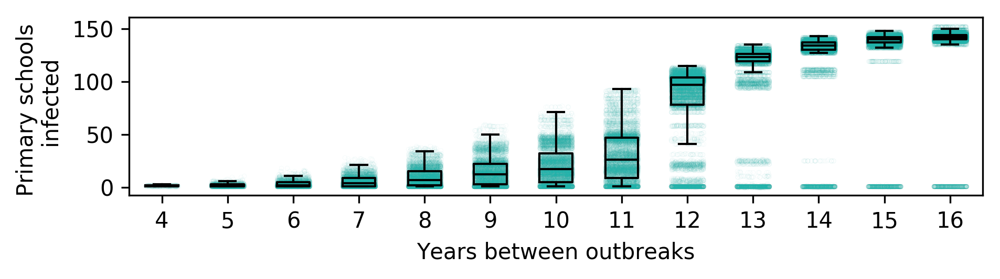

In [468]:
mfs = []
for y in range(13):
    ys = str(y)
    sizelist = list(FS_df_yso_ps.query('Seed in @Reformed_BRIN and vacc == @ys').secondar)
    sizelist_tot = sizelist 
    mfs.append(sizelist_tot)

fig = plt.figure(figsize = [7,1.5], dpi=300)
boxprops = dict(linewidth=1, color='k')
whiskerprops = dict(linewidth=1, color='k')
medianprops = dict(linewidth=1, color='k')
capprops = dict(linewidth=1, color='k')
ax = fig.add_subplot(111)    

for i, mf in enumerate(mfs):
    ax.plot(i + 0.75 + 0.5*np.random.random(len(mf)), mf, 'o', mec='LightSeaGreen', mew=0.2, mfc='none', ms=2, alpha=0.05)


bp = ax.boxplot(mfs, boxprops=boxprops, whiskerprops=whiskerprops, medianprops=medianprops, capprops=capprops, 
                        showfliers=False)



ax.set_xticks(1 + np.arange(13))
l = ax.set_xticklabels(4 + np.arange(13))

ax.set_xlabel('Years between outbreaks')
ax.set_ylabel('Primary schools \n infected')

mfs_sc = mfs
obmeans_sc = np.array([np.median(m) for m in mfs_sc])
print obmeans_sc
print 100*((obmeans_sc - np.roll(obmeans_sc, 1))/np.roll(obmeans_sc, 1))[1:]

In [ ]:

obmeans_sc = np.array([np.median(m) for m in mfs_sc])

[ 0.  0.  0.  0.  0.  0.  0.  0. 15. 24. 26. 28. 28.]


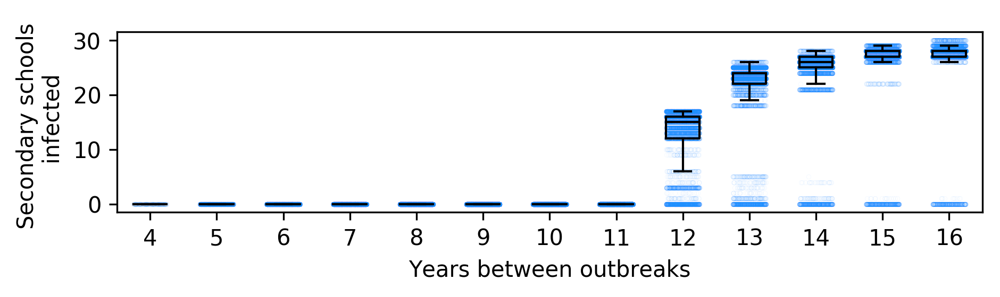

In [467]:
mfs = []
for y in range(13):
    ys = str(y)
    sizelist = list(FS_df_yso_ps.query('Seed in @Reformed_BRIN and vacc == @ys').schools)
    sizelist_tot = sizelist 
    mfs.append(sizelist_tot)

fig = plt.figure(figsize = [7,1.5], dpi=300)
boxprops = dict(linewidth=1, color='k')
whiskerprops = dict(linewidth=1, color='k')
medianprops = dict(linewidth=1, color='k')
capprops = dict(linewidth=1, color='k')
ax = fig.add_subplot(111)    

for i, mf in enumerate(mfs):
    ax.plot(i + 0.75 + 0.5*np.random.random(len(mf)), mf, 'o', mec='DodgerBlue', mew=0.2, mfc='none', ms=2, alpha=0.05)


bp = ax.boxplot(mfs, boxprops=boxprops, whiskerprops=whiskerprops, medianprops=medianprops, capprops=capprops, 
                        showfliers=False)



ax.set_xticks(1 + np.arange(13))
l = ax.set_xticklabels(4 + np.arange(13))

ax.set_xlabel('Years between outbreaks')
ax.set_ylabel('Secondary schools \n infected')

mfs_sc = mfs

obmeans_sc = np.array([np.median(m) for m in mfs_sc])
print obmeans_sc

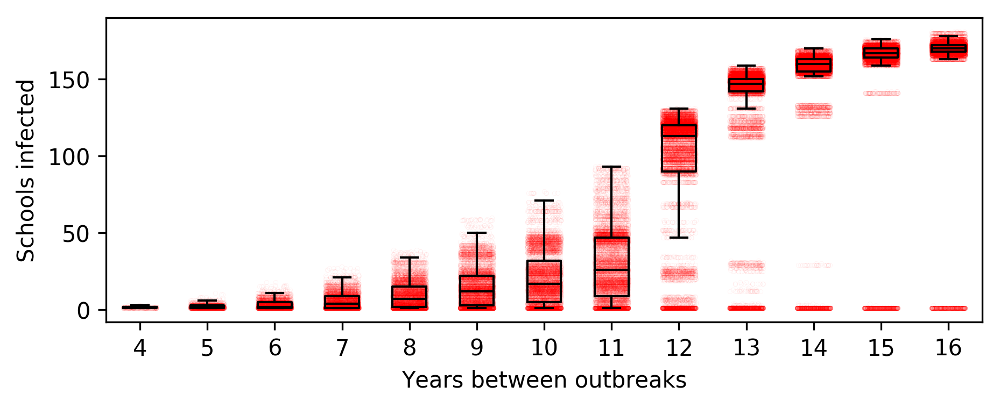

In [411]:
mfs = []
for y in range(13):
    ys = str(y)
    sizelist = list(FS_df_yso.query('Seed in @Reformed_BRIN and vacc == @ys').schools)
    sizelist_tot = sizelist 
    mfs.append(sizelist_tot)

fig = plt.figure(figsize = [7,2.5], dpi=300)
boxprops = dict(linewidth=1, color='k')
whiskerprops = dict(linewidth=1, color='k')
medianprops = dict(linewidth=1, color='k')
capprops = dict(linewidth=1, color='k')
ax = fig.add_subplot(111)    

for i, mf in enumerate(mfs):
    ax.plot(i + 0.75 + 0.5*np.random.random(len(mf)), mf, 'o', mec='r', mew=0.2, mfc='none', ms=2, alpha=0.05)


bp = ax.boxplot(mfs, boxprops=boxprops, whiskerprops=whiskerprops, medianprops=medianprops, capprops=capprops, 
                        showfliers=False)



ax.set_xticks(1 + np.arange(13))
l = ax.set_xticklabels(4 + np.arange(13))

ax.set_xlabel('Years between outbreaks')
ax.set_ylabel('Schools infected')

mfs_sc = mfs

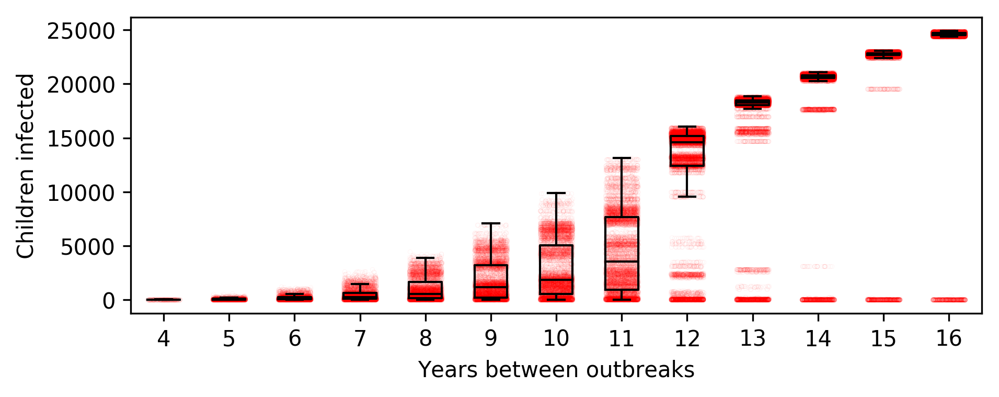

In [550]:
mfs = []
for y in range(13):
    ys = str(y)
    sizelist = list(FS_df_yso.query('Seed in @Reformed_BRIN and vacc == @ys').children)
    sizelist_tot = sizelist
    mfs.append(sizelist_tot)

fig = plt.figure(figsize = [7,2.5], dpi=300)
boxprops = dict(linewidth=1, color='k')
whiskerprops = dict(linewidth=1, color='k')
medianprops = dict(linewidth=1, color='k')
capprops = dict(linewidth=1, color='k')
ax = fig.add_subplot(111)    

for i, mf in enumerate(mfs):
    ax.plot(i + 0.75 + 0.5*np.random.random(len(mf)), mf, 'o', mec='r', mew=0.2, mfc='none', ms=2, alpha=0.05)


bp = ax.boxplot(mfs, boxprops=boxprops, whiskerprops=whiskerprops, medianprops=medianprops, capprops=capprops, 
                        showfliers=False)



ax.set_xticks(1 + np.arange(13))
l = ax.set_xticklabels(4 + np.arange(13))

ax.set_xlabel('Years between outbreaks')
ax.set_ylabel('Children infected')

In [557]:
FS_df_yso.query('Seed in @Reformed_BRIN and vacc == "12"').children.median()

24654.992680057527

In [279]:
obmeans = np.array([np.median(m) for m in mfs])
obmeans_sc = np.array([np.median(m) for m in mfs_sc])


In [280]:
obmeans

array([2.21041301e+01, 6.21218569e+01, 1.33069706e+02, 2.69915963e+02,
       5.71407144e+02, 1.15971391e+03, 1.87000317e+03, 3.53850660e+03,
       1.46174198e+04, 1.83018927e+04, 2.07023287e+04, 2.27672974e+04,
       2.46549927e+04])

In [281]:
100*((obmeans - np.roll(obmeans, 1))/np.roll(obmeans, 1))[1:]

array([181.04185328, 114.20754642, 102.83802522, 111.6981661 ,
       102.95754454,  61.24693857,  89.22463075, 313.0957344 ,
        25.20604111,  13.1157803 ,   9.97457216,   8.29125755])

([<matplotlib.axis.XTick at 0x403c1ee10>,
 <a list of 13 Text xticklabel objects>)

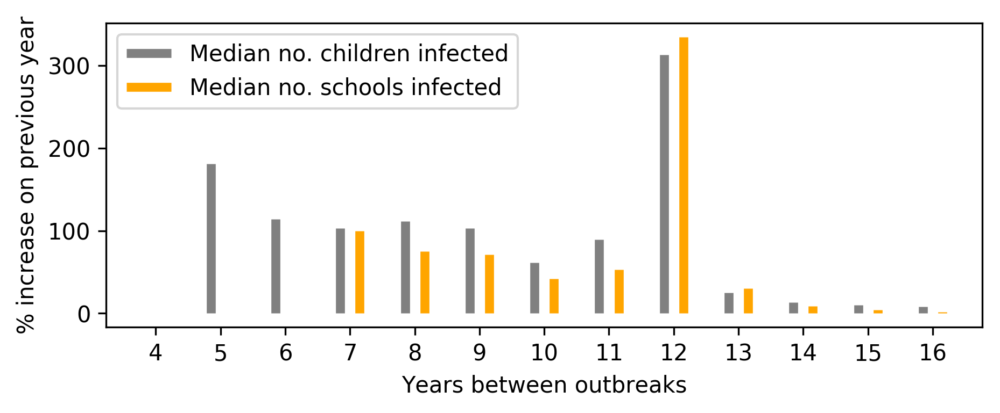

In [368]:
fig = plt.figure(dpi=300, figsize=[7,2.5])
plt.vlines(x=np.arange(4,17) -0.15, ymax=[0] + list(100*((obmeans - np.roll(obmeans, 1))/np.roll(obmeans, 1))[1:]), ymin=0, linewidth=4, color='Grey')
plt.vlines(x=np.arange(4,17) +0.15, ymax=[0] + list(100*((obmeans_sc - np.roll(obmeans_sc, 1))/np.roll(obmeans_sc, 1))[1:]), ymin=0, linewidth=4, color='Orange')

plt.ylabel('% increase on previous year')
plt.xlabel('Years between outbreaks')

plt.legend(['Median no. children infected', 'Median no. schools infected'], loc=2)
plt.xticks(range(4,17))


In [283]:
100*((obmeans_sc - np.roll(obmeans_sc, 1))/np.roll(obmeans_sc, 1))[1:]

array([  0.        ,   0.        , 100.        ,  75.        ,
        71.42857143,  41.66666667,  52.94117647, 334.61538462,
        30.08849558,   8.84353741,   4.375     ,   1.79640719])

In [284]:
obmeans_sc

array([  2.,   2.,   2.,   4.,   7.,  12.,  17.,  26., 113., 147., 160.,
       167., 170.])

In [309]:
from mpl_toolkits.axes_grid1 import make_axes_locatable

/Users/LAPT0084/anaconda/lib/python2.7/site-packages/matplotlib/colorbar.py:215: UserWarning: Use the colorbar set_ticks() method instead.
  warnings.warn("Use the colorbar set_ticks() method instead.")


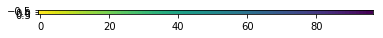

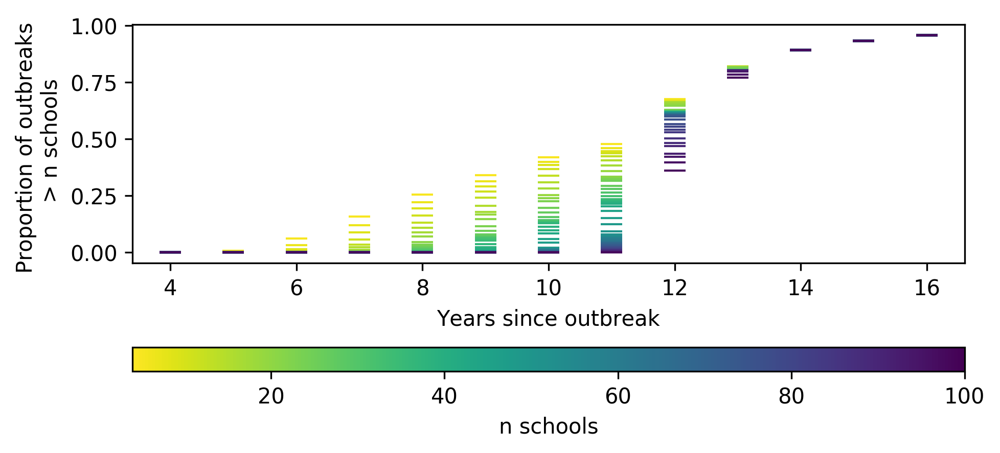

In [469]:
pic = plt.imshow([range(4, 101)], cmap='viridis_r')

fig = plt.figure(dpi=300, figsize=[7,3])
ax = fig.add_subplot(111)
cmap = cm.get_cmap('viridis_r')
divider = make_axes_locatable(ax)
cax = divider.append_axes("bottom", size='10%', pad=0.55)

for nsch in np.arange(4, 100, 2):
    ax.plot(4 + np.arange(13), [sum(np.array(mfs_sc[y]) > nsch)/(1.*len(mfs_sc[12])) for y in range(13)], '_', markersize=10, color = cmap((nsch - 3.)/97.))
ax.set_ylabel('Proportion of outbreaks \n > n schools')
ax.set_xlabel('Years since outbreak')
plt.colorbar(pic, cax=cax, orientation='horizontal')

plt.xticks(4 + np.arange(13))
cax.set_xlabel('n schools')

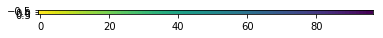

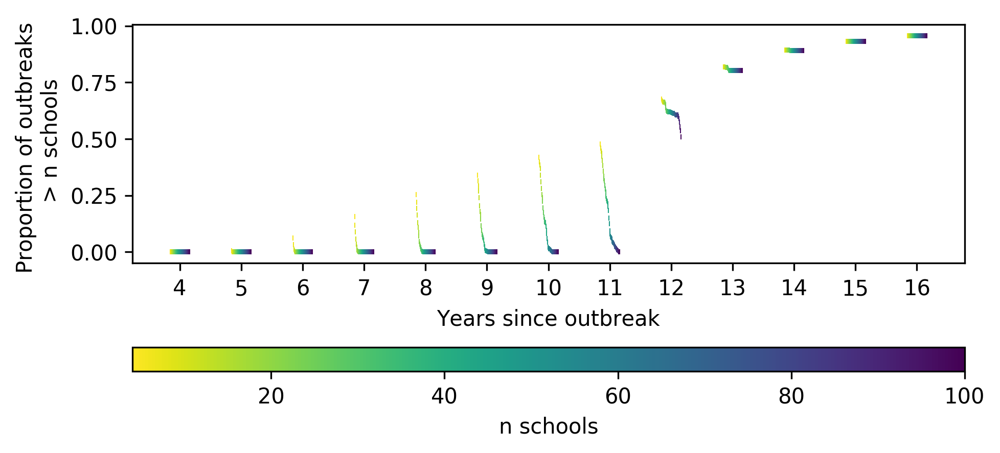

In [370]:
import matplotlib
pic = plt.imshow([range(4, 101)], cmap='viridis_r')

fig = plt.figure(dpi=300, figsize=[7,3])
ax = fig.add_subplot(111)
cmap = cm.get_cmap('viridis_r')
divider = make_axes_locatable(ax)
cax = divider.append_axes("bottom", size='10%', pad=0.55)

for nsch in np.arange(4, 100, 2):
    t = matplotlib.markers.MarkerStyle(marker='|')
    #t._transform = t.get_transform().rotate_deg(-1*(nsch - 50))
    
    ax.scatter(4 + np.arange(13) + (nsch - 50)/300., [sum(np.array(mfs_sc[y]) > nsch)/(1.*len(mfs_sc[12])) for y in range(13)], marker=t, s=5, lw=0.5, color = cmap((nsch - 3.)/97.))
ax.set_ylabel('Proportion of outbreaks \n > n schools')
ax.set_xlabel('Years since outbreak')
plt.colorbar(pic, cax=cax, orientation='horizontal')

ax.set_xticks(4 + np.arange(13))
cax.set_xlabel('n schools')

([<matplotlib.axis.XTick at 0x54ac7de50>,
 <a list of 13 Text xticklabel objects>)

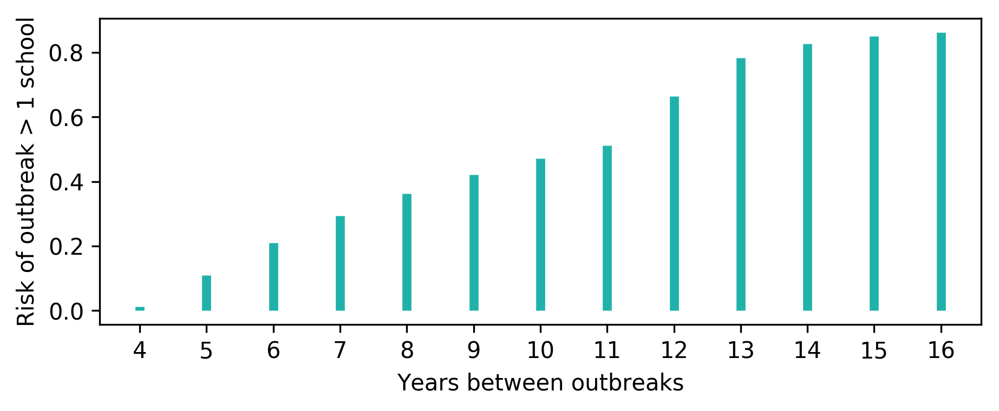

In [307]:
fig = plt.figure(dpi=300, figsize=[7,2.5])
plt.vlines(x=np.arange(4,17), ymax=[len(obs)/(len(Reformed_BRIN) * 100.) for obs in mfs_sc], ymin=0, linewidth=4, color='LightSeaGreen')

plt.ylabel('Risk of outbreak > 1 school')
plt.xlabel('Years between outbreaks')
plt.xticks(range(4,17))

In [366]:
[len(obs)/(len(Reformed_BRIN) * 100.) for obs in mfs_sc]

[0.01201923076923077,
 0.10971153846153846,
 0.21014423076923078,
 0.2935096153846154,
 0.3622115384615385,
 0.42149038461538463,
 0.4714423076923077,
 0.5118269230769231,
 0.6650961538461538,
 0.7828846153846154,
 0.8278365384615385,
 0.8506730769230769,
 0.8628846153846154]

In [39]:
mfs_all = []
for y in range(13):
    ys = str(y)
    sizelist = list(FS_df_yso.query('vacc == @ys').schools)
    sizelist_tot = sizelist 
    mfs_all.append(sizelist_tot)

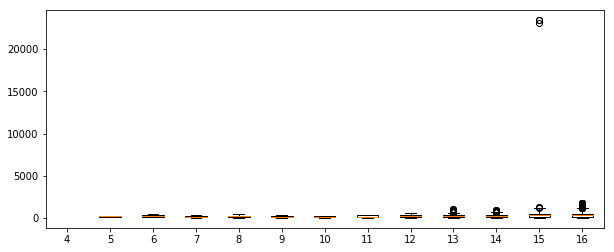

In [994]:
mfs = []
for y in range(13):
    ys = str(y)
    mfs.append(list(FS_df_yso.query('Seed in @Anthro_BRIN and vacc == @ys').children))

fig = plt.figure(figsize = [10,4])
ax = fig.add_subplot(111)
bp = ax.boxplot(mfs)
ax.set_xticklabels(4 + np.arange(13))


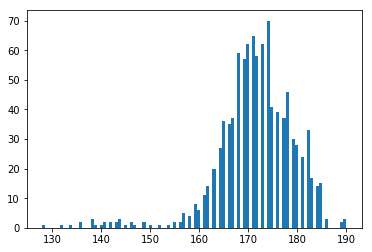

In [914]:
plt.hist([len(con) for i, con in enumerate(loaded_cons) if loaded_seeds[i]=='03LQ00'], bins=100)
mean_schools = [[seed, sum([len(con) for i, con in enumerate(loaded_cons) if loaded_seeds[i]==seed])/500.] for seed in set(loaded_seeds)]
mean_schools_scaled = [[seed, sum([len(con) for i, con in enumerate(loaded_cons) if loaded_seeds[i]==seed])/(500*20.)] for seed in set(loaded_seeds)]

In [40]:
sizedict = dict(mean_schools)
sizedict_scaled = dict(mean_schools_scaled)

NameError: name 'mean_schools' is not defined

In [ ]:
p25_schools = [[seed, np.std([len(con) for i, con in enumerate(cons) if seeds[i]==seed])] for seed in set(seeds)]
p75_schools = [[seed, np.std([len(con) for i, con in enumerate(cons) if seeds[i]==seed])] for seed in set(seeds)]

In [ ]:
p25dict = dict(p25_schools)
p75dict = dict(p75_schools)

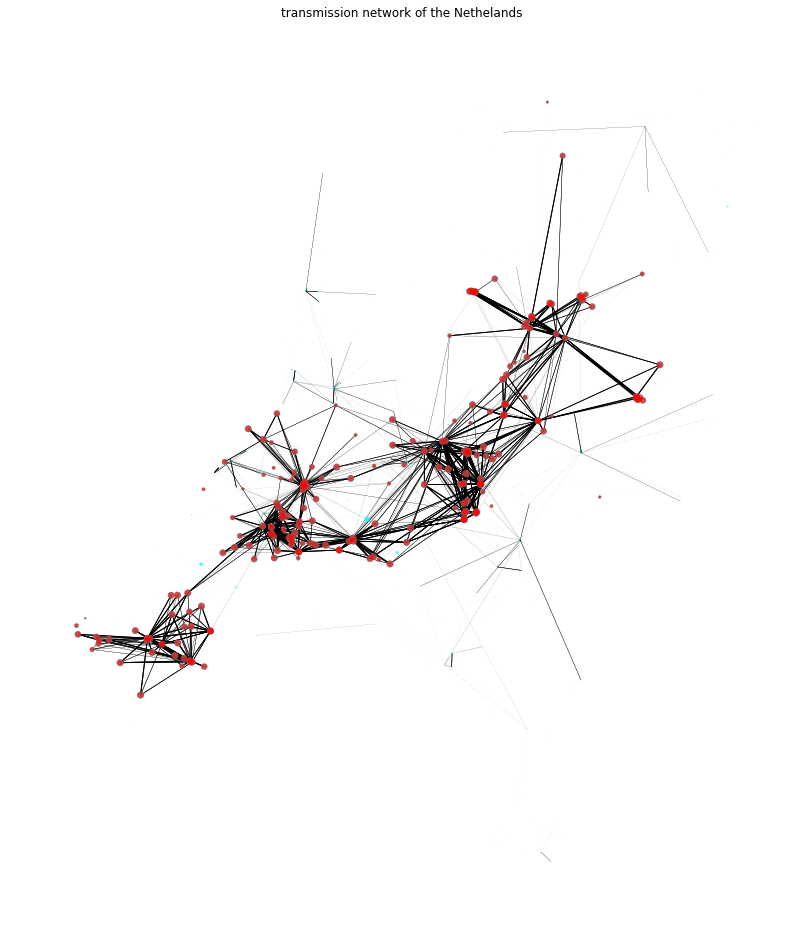

In [508]:
transnet.plot_transnet(transnet.trans_net.subgraph(nbunch=np.intersect1d(transnet.nodes, all_keeps)),pos=transnet.pos_geo,highlight=Reformed_BRIN, sizes=sizedict_scaled)

In [58]:
transnet.plot_transnet(transnet.trans_net.subgraph(nbunch=np.intersect1d(transnet.nodes, all_keeps)),pos=transnet.pos_geo,highlight=Reformed_BRIN, sizes=sizedict_scaled)

NameError: name 'all_keeps' is not defined

In [509]:
meanfsframe = pd.DataFrame.from_dict(sizedict, orient='index', columns=['Mean FS']).convert_objects(convert_numeric=True)
p25fsframe = pd.DataFrame.from_dict(p25dict, orient='index', columns=['p25 FS']).convert_objects(convert_numeric=True)
p75fsframe = pd.DataFrame.from_dict(p75dict, orient='index', columns=['p75 FS']).convert_objects(convert_numeric=True)
vacc_size_1k = pd.concat([vacc_frame[['median', 'p25', 'p75']],meanfsframe,  p25fsframe, p75fsframe], axis=1)

/Users/LAPT0084/anaconda/lib/python2.7/site-packages/ipykernel/__main__.py:1: FutureWarning: convert_objects is deprecated.  To re-infer data dtypes for object columns, use DataFrame.infer_objects()
For all other conversions use the data-type specific converters pd.to_datetime, pd.to_timedelta and pd.to_numeric.
  if __name__ == '__main__':
/Users/LAPT0084/anaconda/lib/python2.7/site-packages/ipykernel/__main__.py:2: FutureWarning: convert_objects is deprecated.  To re-infer data dtypes for object columns, use DataFrame.infer_objects()
For all other conversions use the data-type specific converters pd.to_datetime, pd.to_timedelta and pd.to_numeric.
  from ipykernel import kernelapp as app
/Users/LAPT0084/anaconda/lib/python2.7/site-packages/ipykernel/__main__.py:3: FutureWarning: convert_objects is deprecated.  To re-infer data dtypes for object columns, use DataFrame.infer_objects()
For all other conversions use the data-type specific converters pd.to_datetime, pd.to_timedelta and pd.

In [26]:
FS_df_spat = make_FS_df(spatial_cons, spatial_seeds, spatial_vacc, transnet.vacc_dict_samples)

In [27]:
FS_df_net = make_FS_df(loaded_cons, loaded_seeds, loaded_vacc, transnet.vacc_dict_samples)

In [586]:
FS_df = pd.DataFrame(FS_new, columns=['Seed', 'schools', 'children'])

In [661]:
FS_df.to_csv('netFSdict.csv')

In [42]:
def calculate_pc4_risk(res, vacc_dict, nodelist, no_runs=1000):
    no_runs=len(res)
    
    all_res = pd.DataFrame(res.T, columns = ['run ' + str(run + 1) for run in range(len(res))])
    all_res['BRIN'] = nodelist
    schools_pc4_vo = pd.read_csv(r'/Users/LAPT0084/Documents/PhD/Objective 4 -  Integration through schools/Dutch data/02.-leerlingen-per-vestiging-naar-postcode-en-leerjaar-2017-2018.csv')
    zeropad = lambda n: '%02d' % n
    BRIN = np.array(schools_pc4_vo['BRIN NUMMER']) + np.array(map(zeropad, schools_pc4_vo['VESTIGINGSNUMMER']))
    schools_pc4_vo['BRIN'] = BRIN
    
    schools_pc4_vo['TOTAAL'] = schools_pc4_vo[[u'LEER- OF VERBLIJFSJAAR 1',
       u'LEER- OF VERBLIJFSJAAR 2', u'LEER- OF VERBLIJFSJAAR 3',
       u'LEER- OF VERBLIJFSJAAR 4', u'LEER- OF VERBLIJFSJAAR 5',
       u'LEER- OF VERBLIJFSJAAR 6']].sum(axis=1)
    schools_pc4_vo = schools_pc4_vo.rename(columns = {'POSTCODE LEERLING':'PC4'})
    
    schools_pc4_vo = schools_pc4_vo[['BRIN', 'PC4', 'TOTAAL']]
    
    PO_path = r'/Users/LAPT0084/Documents/PhD/Objective 4 -  Integration through schools/Dutch data/03.-leerlingen-po-per-gemeente-postcode-leerling,-leeftijd-2017-2018'
    
    schools_pc4_po = pd.DataFrame()
    
    for pofile in os.listdir(PO_path):
        
        schools_pc4_po = schools_pc4_po.append(pd.read_csv(PO_path + '//' + pofile, delimiter=';'))
    
    
    BRIN = np.array(schools_pc4_po['BRIN_NUMMER']) + np.array(map(zeropad, schools_pc4_po['VESTIGINGSNUMMER']))
    schools_pc4_po['BRIN'] = BRIN
    schools_pc4_po = schools_pc4_po.rename(columns = {'POSTCODE_LEERLING':'PC4'})
    
    schools_pc4_po = schools_pc4_po[['BRIN', 'PC4', 'TOTAAL']]
    
    schools_pc4 = schools_pc4_po.append(schools_pc4_vo)
    
    
    fs = []
    for B in all_res.BRIN:
        fs.append([B, max((1.-vacc_dict[B])*models.op_fs(1.-vacc_dict[B], 15.),0.)])
    
    fsdf = pd.DataFrame(fs, columns=['BRIN', 'fs'])
    schools_pc4_cases = schools_pc4.merge(all_res, on='BRIN')
    schools_pc4_cases = schools_pc4_cases.convert_objects(convert_numeric=True)
    #return infsch, schools_pc4_cases 
    
    schools_pc4_cases = schools_pc4_cases.merge(fsdf, on='BRIN')
    schools_pc4_cases = schools_pc4_cases.convert_objects(convert_numeric=True)
    
    PC_Vacc = iv.vacc_pc4_dict(res[0][0], vacc_dict, by='pc4')
    
    PC_Vacc = PC_Vacc.convert_objects(convert_numeric=True)
    school_Vacc = pd.DataFrame(np.transpose([vacc_dict.keys(), vacc_dict.values()]), columns=['BRIN', 'vacc'])
    
    schools_pc4_cases = schools_pc4_cases.merge(PC_Vacc, on='PC4')
    
    schools_pc4_cases = schools_pc4_cases.merge(school_Vacc, on='BRIN')
    #return schools_pc4_cases
    
    schools_pc4_cases = schools_pc4_cases.merge(schools_pc4_cases.groupby('BRIN').sum().reset_index()[['BRIN', 'TOTAAL']].rename(columns={'TOTAAL':'ssize'}), on='BRIN')
    for run in range(1, no_runs + 1):
    
        #schools_pc4_cases['cases_' + str(run)] = (1 -  0.1*schools_pc4_cases.TOTAAL/schools_pc4_cases.ssize)**(schools_pc4_cases['run ' + str(run)] * schools_pc4_cases.fs * schools_pc4_cases.ssize)
        schools_pc4_cases['cases_' + str(run)] = schools_pc4_cases['run ' + str(run)] * schools_pc4_cases.TOTAAL * schools_pc4_cases.fs
    
    #PC_Cases = 1. - schools_pc4_cases.groupby('PC4').prod()[['cases_' + str(run) for run in range(1, no_runs + 1)]].reset_index()
    PC_Cases = schools_pc4_cases.groupby('PC4').sum()[['cases_' + str(run) for run in range(1, no_runs + 1)]].reset_index()

    
    return PC_Cases

In [56]:
def plot_resmap(cons, seeds):
    locs = np.where(np.array(seeds) == "04CN00")[0]
    res_array = np.array([np.in1d(transnet.nodes, np.array(n)) for n in  np.array(cons)[locs]])*1.
    PC_Cases = calculate_pc4_risk(res_array,transnet.vacc_dict_samples['sample 0'], transnet.nodes)
    pc4_shapes = pl.roc_map(PC_Cases)
    pl.plot_rocmap(pc4_shapes.dropna(subset=['Shape_Area']))
    return PC_Cases, pc4_shapes


In [28]:
locs = np.where(np.array(loaded_seeds) == "04CN00")[0]
res_array = np.array([np.in1d(transnet.nodes, np.array(n)) for n in  np.array(loaded_cons)[locs]])*1.


184.0

/Users/LAPT0084/anaconda/lib/python2.7/site-packages/ipykernel/__main__.py:43: FutureWarning: convert_objects is deprecated.  To re-infer data dtypes for object columns, use DataFrame.infer_objects()
For all other conversions use the data-type specific converters pd.to_datetime, pd.to_timedelta and pd.to_numeric.
/Users/LAPT0084/anaconda/lib/python2.7/site-packages/ipykernel/__main__.py:47: FutureWarning: convert_objects is deprecated.  To re-infer data dtypes for object columns, use DataFrame.infer_objects()
For all other conversions use the data-type specific converters pd.to_datetime, pd.to_timedelta and pd.to_numeric.
/Users/LAPT0084/anaconda/lib/python2.7/site-packages/ipykernel/__main__.py:51: FutureWarning: convert_objects is deprecated.  To re-infer data dtypes for object columns, use DataFrame.infer_objects()
For all other conversions use the data-type specific converters pd.to_datetime, pd.to_timedelta and pd.to_numeric.
plotting.py:705: RuntimeWarning: divide by zero encount

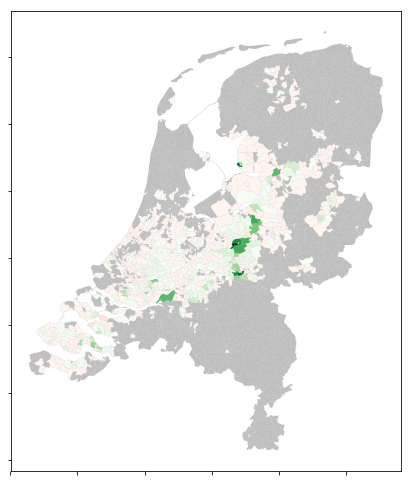

In [707]:
PC_Cases_yso11, pc4shapes_yso11 = plot_resmap(list(np.array(loaded_cons_yso)[np.array(loaded_vacc_yso) == '10']), list(np.array(loaded_seeds_yso)[np.array(loaded_vacc_yso) == '10']))

/Users/LAPT0084/anaconda/lib/python2.7/site-packages/ipykernel/__main__.py:43: FutureWarning: convert_objects is deprecated.  To re-infer data dtypes for object columns, use DataFrame.infer_objects()
For all other conversions use the data-type specific converters pd.to_datetime, pd.to_timedelta and pd.to_numeric.
/Users/LAPT0084/anaconda/lib/python2.7/site-packages/ipykernel/__main__.py:47: FutureWarning: convert_objects is deprecated.  To re-infer data dtypes for object columns, use DataFrame.infer_objects()
For all other conversions use the data-type specific converters pd.to_datetime, pd.to_timedelta and pd.to_numeric.
/Users/LAPT0084/anaconda/lib/python2.7/site-packages/ipykernel/__main__.py:51: FutureWarning: convert_objects is deprecated.  To re-infer data dtypes for object columns, use DataFrame.infer_objects()
For all other conversions use the data-type specific converters pd.to_datetime, pd.to_timedelta and pd.to_numeric.


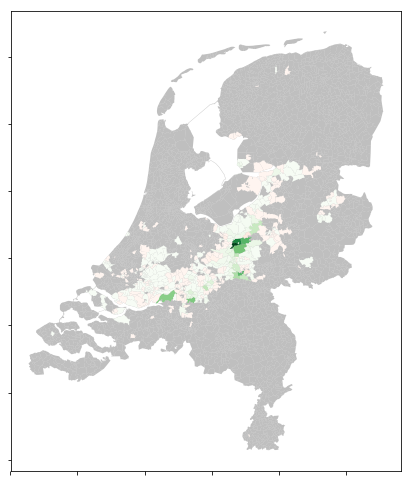

In [753]:
PC_Cases_yso5, pc4shapes_yso5 = plot_resmap(list(np.array(loaded_cons_yso)[np.array(loaded_vacc_yso) == '4']), list(np.array(loaded_seeds_yso)[np.array(loaded_vacc_yso) == '4']))

/Users/LAPT0084/anaconda/lib/python2.7/site-packages/ipykernel/__main__.py:43: FutureWarning: convert_objects is deprecated.  To re-infer data dtypes for object columns, use DataFrame.infer_objects()
For all other conversions use the data-type specific converters pd.to_datetime, pd.to_timedelta and pd.to_numeric.
/Users/LAPT0084/anaconda/lib/python2.7/site-packages/ipykernel/__main__.py:47: FutureWarning: convert_objects is deprecated.  To re-infer data dtypes for object columns, use DataFrame.infer_objects()
For all other conversions use the data-type specific converters pd.to_datetime, pd.to_timedelta and pd.to_numeric.
/Users/LAPT0084/anaconda/lib/python2.7/site-packages/ipykernel/__main__.py:51: FutureWarning: convert_objects is deprecated.  To re-infer data dtypes for object columns, use DataFrame.infer_objects()
For all other conversions use the data-type specific converters pd.to_datetime, pd.to_timedelta and pd.to_numeric.


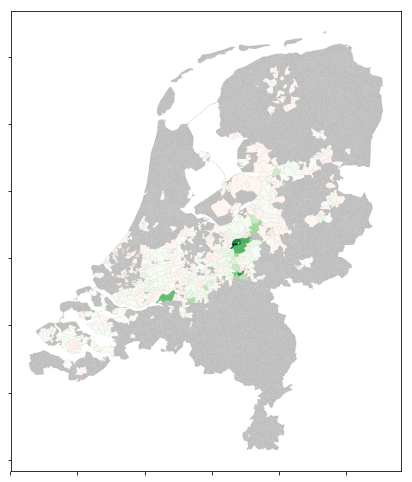

In [720]:
PC_Cases_yso7, pc4shapes_yso7 = plot_resmap(list(np.array(loaded_cons_yso)[np.array(loaded_vacc_yso) == '6']), list(np.array(loaded_seeds_yso)[np.array(loaded_vacc_yso) == '6']))

/Users/LAPT0084/anaconda/lib/python2.7/site-packages/ipykernel/__main__.py:43: FutureWarning: convert_objects is deprecated.  To re-infer data dtypes for object columns, use DataFrame.infer_objects()
For all other conversions use the data-type specific converters pd.to_datetime, pd.to_timedelta and pd.to_numeric.
/Users/LAPT0084/anaconda/lib/python2.7/site-packages/ipykernel/__main__.py:47: FutureWarning: convert_objects is deprecated.  To re-infer data dtypes for object columns, use DataFrame.infer_objects()
For all other conversions use the data-type specific converters pd.to_datetime, pd.to_timedelta and pd.to_numeric.
/Users/LAPT0084/anaconda/lib/python2.7/site-packages/ipykernel/__main__.py:51: FutureWarning: convert_objects is deprecated.  To re-infer data dtypes for object columns, use DataFrame.infer_objects()
For all other conversions use the data-type specific converters pd.to_datetime, pd.to_timedelta and pd.to_numeric.


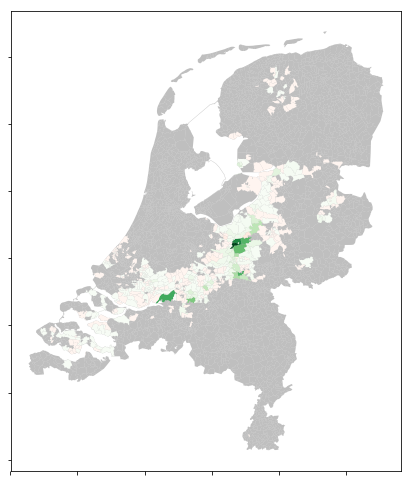

In [776]:
PC_Cases_yso6, pc4shapes_yso6 = plot_resmap(list(np.array(loaded_cons_yso)[np.array(loaded_vacc_yso) == '5']), list(np.array(loaded_seeds_yso)[np.array(loaded_vacc_yso) == '5']))

/Users/LAPT0084/anaconda/lib/python2.7/site-packages/ipykernel/__main__.py:43: FutureWarning: convert_objects is deprecated.  To re-infer data dtypes for object columns, use DataFrame.infer_objects()
For all other conversions use the data-type specific converters pd.to_datetime, pd.to_timedelta and pd.to_numeric.
/Users/LAPT0084/anaconda/lib/python2.7/site-packages/ipykernel/__main__.py:47: FutureWarning: convert_objects is deprecated.  To re-infer data dtypes for object columns, use DataFrame.infer_objects()
For all other conversions use the data-type specific converters pd.to_datetime, pd.to_timedelta and pd.to_numeric.
/Users/LAPT0084/anaconda/lib/python2.7/site-packages/ipykernel/__main__.py:51: FutureWarning: convert_objects is deprecated.  To re-infer data dtypes for object columns, use DataFrame.infer_objects()
For all other conversions use the data-type specific converters pd.to_datetime, pd.to_timedelta and pd.to_numeric.


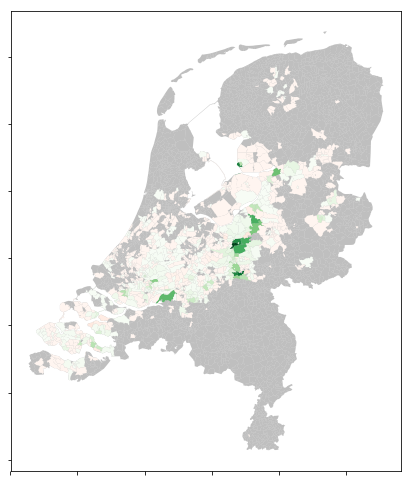

In [777]:
PC_Cases_yso9, pc4shapes_yso9 = plot_resmap(list(np.array(loaded_cons_yso)[np.array(loaded_vacc_yso) == '8']), list(np.array(loaded_seeds_yso)[np.array(loaded_vacc_yso) == '8']))

/Users/LAPT0084/anaconda/lib/python2.7/site-packages/ipykernel/__main__.py:43: FutureWarning: convert_objects is deprecated.  To re-infer data dtypes for object columns, use DataFrame.infer_objects()
For all other conversions use the data-type specific converters pd.to_datetime, pd.to_timedelta and pd.to_numeric.
/Users/LAPT0084/anaconda/lib/python2.7/site-packages/ipykernel/__main__.py:47: FutureWarning: convert_objects is deprecated.  To re-infer data dtypes for object columns, use DataFrame.infer_objects()
For all other conversions use the data-type specific converters pd.to_datetime, pd.to_timedelta and pd.to_numeric.
/Users/LAPT0084/anaconda/lib/python2.7/site-packages/ipykernel/__main__.py:51: FutureWarning: convert_objects is deprecated.  To re-infer data dtypes for object columns, use DataFrame.infer_objects()
For all other conversions use the data-type specific converters pd.to_datetime, pd.to_timedelta and pd.to_numeric.


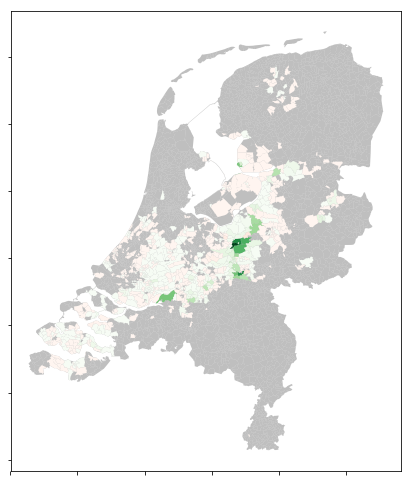

In [782]:
PC_Cases_yso8, pc4shapes_yso8 = plot_resmap(list(np.array(loaded_cons_yso)[np.array(loaded_vacc_yso) == '7']), list(np.array(loaded_seeds_yso)[np.array(loaded_vacc_yso) == '7']))

/Users/LAPT0084/anaconda/lib/python2.7/site-packages/ipykernel/__main__.py:43: FutureWarning: convert_objects is deprecated.  To re-infer data dtypes for object columns, use DataFrame.infer_objects()
For all other conversions use the data-type specific converters pd.to_datetime, pd.to_timedelta and pd.to_numeric.
/Users/LAPT0084/anaconda/lib/python2.7/site-packages/ipykernel/__main__.py:47: FutureWarning: convert_objects is deprecated.  To re-infer data dtypes for object columns, use DataFrame.infer_objects()
For all other conversions use the data-type specific converters pd.to_datetime, pd.to_timedelta and pd.to_numeric.
/Users/LAPT0084/anaconda/lib/python2.7/site-packages/ipykernel/__main__.py:51: FutureWarning: convert_objects is deprecated.  To re-infer data dtypes for object columns, use DataFrame.infer_objects()
For all other conversions use the data-type specific converters pd.to_datetime, pd.to_timedelta and pd.to_numeric.


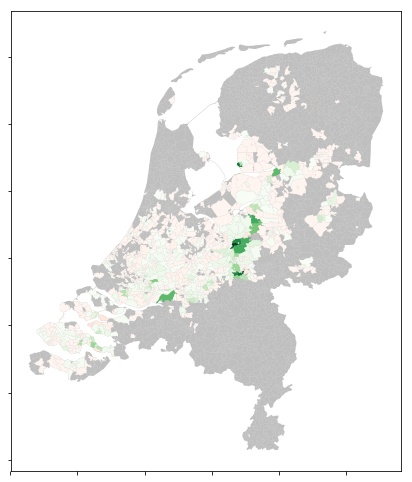

In [778]:
PC_Cases_yso10, pc4shapes_yso10 = plot_resmap(list(np.array(loaded_cons_yso)[np.array(loaded_vacc_yso) == '9']), list(np.array(loaded_seeds_yso)[np.array(loaded_vacc_yso) == '9']))

In [57]:
def plot_binary(PC_Cases, pc4shapes, ax):
    PC_Cases_binary = (PC_Cases.set_index('PC4') >0).mean(axis=1)
    pc4shapes_pi = pc4shapes.set_index('PC4')
    pc4shapes_pi['binary'] = PC_Cases_binary
    pc4shapes_pi.dropna(subset=['Shape_Area']).plot('binary', cmap='viridis', linewidth=0, alpha=1., ax=ax)
    ax.spines['top'].set_visible(False)
    ax.spines['bottom'].set_visible(False)
    ax.spines['right'].set_visible(False)
    ax.spines['left'].set_visible(False)
    ax.set_xticks([])
    ax.set_yticks([])

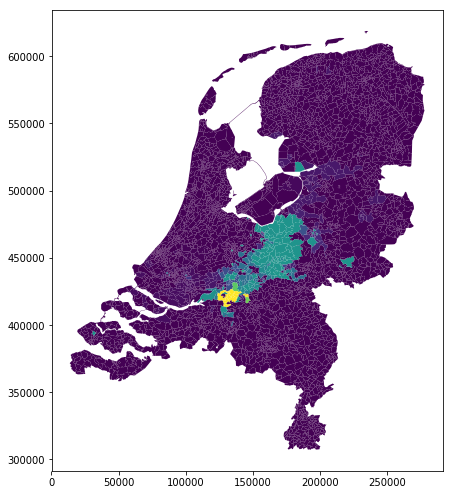

In [771]:
plot_binary(PC_Cases_yso5, pc4shapes_yso5)

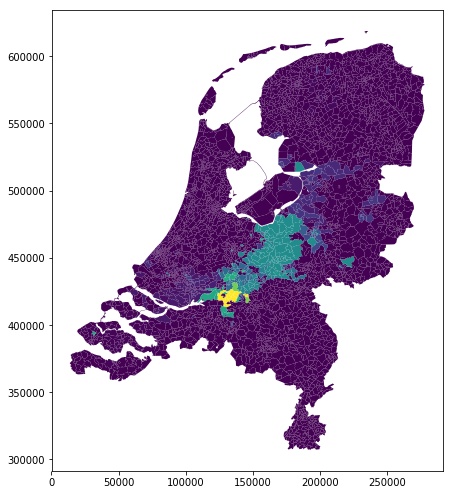

In [779]:
plot_binary(PC_Cases_yso6, pc4shapes_yso6)

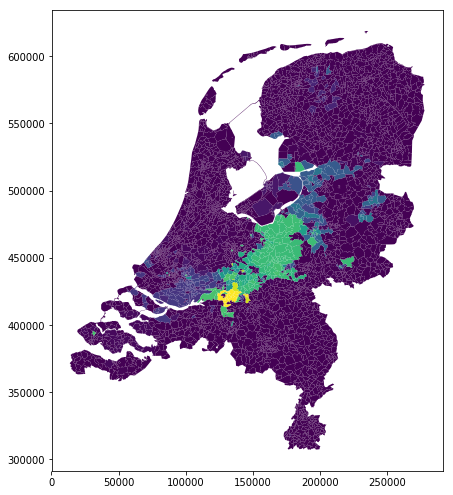

In [772]:
plot_binary(PC_Cases_yso7, pc4shapes_yso7)

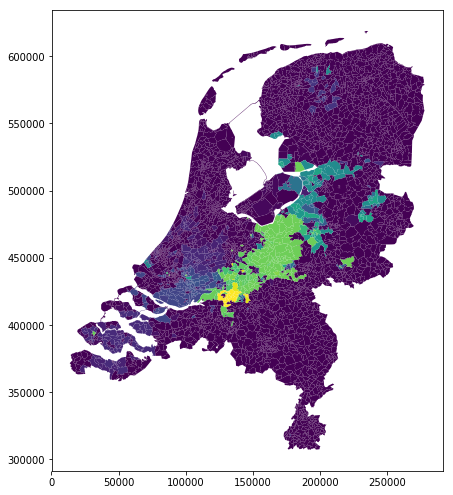

In [783]:
plot_binary(PC_Cases_yso8, pc4shapes_yso8)

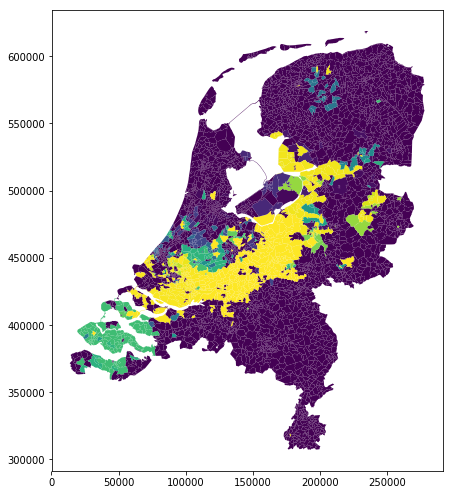

In [780]:
plot_binary(PC_Cases_yso9, pc4shapes_yso9)

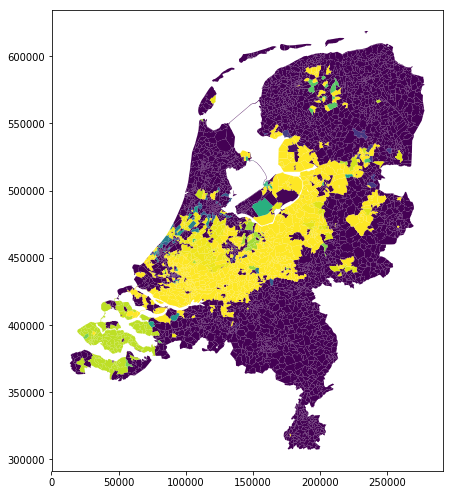

In [781]:
plot_binary(PC_Cases_yso10, pc4shapes_yso10)

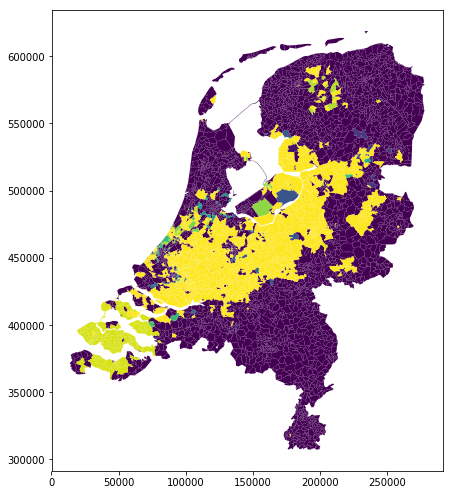

In [774]:
plot_binary(PC_Cases_yso11, pc4shapes_yso11)

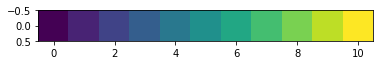

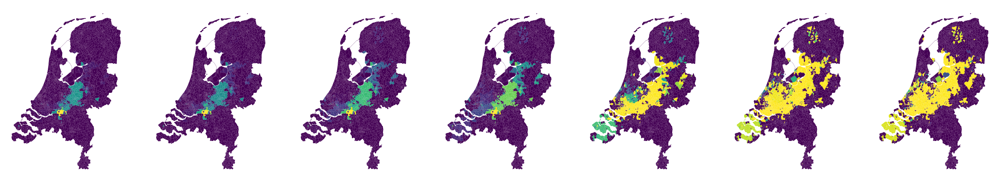

In [800]:
pccasess = [PC_Cases_yso5,PC_Cases_yso6,PC_Cases_yso7,PC_Cases_yso8,PC_Cases_yso9,PC_Cases_yso10,PC_Cases_yso11]
pc4shapess = [pc4shapes_yso5,pc4shapes_yso6,pc4shapes_yso7,pc4shapes_yso8,pc4shapes_yso9,pc4shapes_yso10,pc4shapes_yso11]

pic = plt.imshow([np.arange(0, 1.1,0.1)], cmap='viridis')

fig = plt.figure(dpi=120, figsize=[len(pccasess)*4, 5.])

cmap = cm.get_cmap('viridis_r')
divider = make_axes_locatable(ax)
cax = divider.append_axes("bottom", size='10%', pad=0.55)
for i in range(len(pccasess)):
    ax = fig.add_subplot(1,len(pccasess),  i+1)
    plot_binary(pccasess[i], pc4shapess[i], ax)


plt.colorbar(pic, cax=cax, orientation='horizontal', alpha=0.5)


cax.set_xlabel('Proportion of simulations')

In [760]:
pc4shapes_yso7_pi.binary.min()

0.0

/Users/LAPT0084/anaconda/lib/python2.7/site-packages/ipykernel/__main__.py:43: FutureWarning: convert_objects is deprecated.  To re-infer data dtypes for object columns, use DataFrame.infer_objects()
For all other conversions use the data-type specific converters pd.to_datetime, pd.to_timedelta and pd.to_numeric.
/Users/LAPT0084/anaconda/lib/python2.7/site-packages/ipykernel/__main__.py:47: FutureWarning: convert_objects is deprecated.  To re-infer data dtypes for object columns, use DataFrame.infer_objects()
For all other conversions use the data-type specific converters pd.to_datetime, pd.to_timedelta and pd.to_numeric.
/Users/LAPT0084/anaconda/lib/python2.7/site-packages/ipykernel/__main__.py:51: FutureWarning: convert_objects is deprecated.  To re-infer data dtypes for object columns, use DataFrame.infer_objects()
For all other conversions use the data-type specific converters pd.to_datetime, pd.to_timedelta and pd.to_numeric.


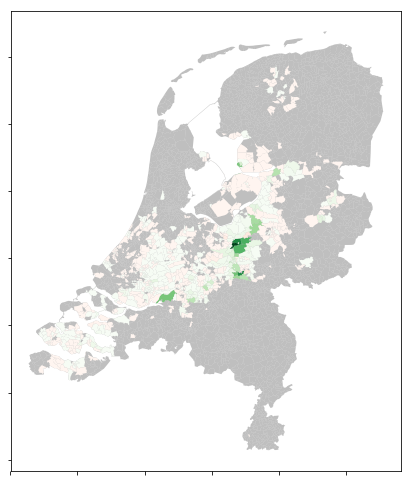

In [715]:
PC_Cases_yso7, pc4shapes_yso7 = plot_resmap(list(np.array(loaded_cons_yso)[np.array(loaded_vacc_yso) == '7']), list(np.array(loaded_seeds_yso)[np.array(loaded_vacc_yso) == '7']))

/Users/LAPT0084/anaconda/lib/python2.7/site-packages/ipykernel/__main__.py:43: FutureWarning: convert_objects is deprecated.  To re-infer data dtypes for object columns, use DataFrame.infer_objects()
For all other conversions use the data-type specific converters pd.to_datetime, pd.to_timedelta and pd.to_numeric.
/Users/LAPT0084/anaconda/lib/python2.7/site-packages/ipykernel/__main__.py:47: FutureWarning: convert_objects is deprecated.  To re-infer data dtypes for object columns, use DataFrame.infer_objects()
For all other conversions use the data-type specific converters pd.to_datetime, pd.to_timedelta and pd.to_numeric.
/Users/LAPT0084/anaconda/lib/python2.7/site-packages/ipykernel/__main__.py:51: FutureWarning: convert_objects is deprecated.  To re-infer data dtypes for object columns, use DataFrame.infer_objects()
For all other conversions use the data-type specific converters pd.to_datetime, pd.to_timedelta and pd.to_numeric.


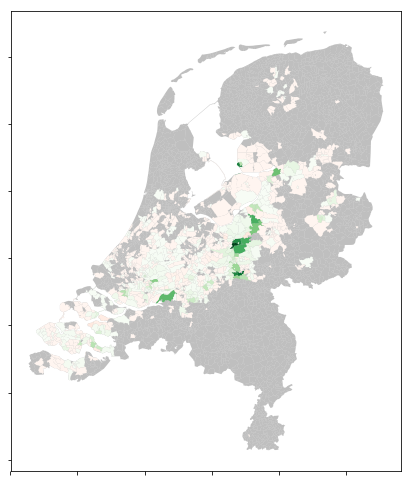

In [716]:
PC_Cases_yso8, pc4shapes_yso8 = plot_resmap(list(np.array(loaded_cons_yso)[np.array(loaded_vacc_yso) == '8']), list(np.array(loaded_seeds_yso)[np.array(loaded_vacc_yso) == '8']))

In [709]:
rocs_14 = pl.roc_values_weighted(PC_Cases_yso11,100)
ssvals_14 = np.array(rocs_14)[:,[0,2]].T

In [717]:
rocs_11 = pl.roc_values_weighted(PC_Cases_yso7,100)
ssvals_11 = np.array(rocs_11)[:,[0,2]].T

In [718]:
rocs_12 = pl.roc_values_weighted(PC_Cases_yso8,100)
ssvals_12 = np.array(rocs_12)[:,[0,2]].T

In [55]:
PC_Cases_SS, pc4shapes_SS = plot_resmap(spatial_cons, spatial_seeds)

NameError: name 'plot_resmap' is not defined

/Users/LAPT0084/anaconda/lib/python2.7/site-packages/ipykernel/__main__.py:43: FutureWarning: convert_objects is deprecated.  To re-infer data dtypes for object columns, use DataFrame.infer_objects()
For all other conversions use the data-type specific converters pd.to_datetime, pd.to_timedelta and pd.to_numeric.
/Users/LAPT0084/anaconda/lib/python2.7/site-packages/ipykernel/__main__.py:47: FutureWarning: convert_objects is deprecated.  To re-infer data dtypes for object columns, use DataFrame.infer_objects()
For all other conversions use the data-type specific converters pd.to_datetime, pd.to_timedelta and pd.to_numeric.
/Users/LAPT0084/anaconda/lib/python2.7/site-packages/ipykernel/__main__.py:51: FutureWarning: convert_objects is deprecated.  To re-infer data dtypes for object columns, use DataFrame.infer_objects()
For all other conversions use the data-type specific converters pd.to_datetime, pd.to_timedelta and pd.to_numeric.


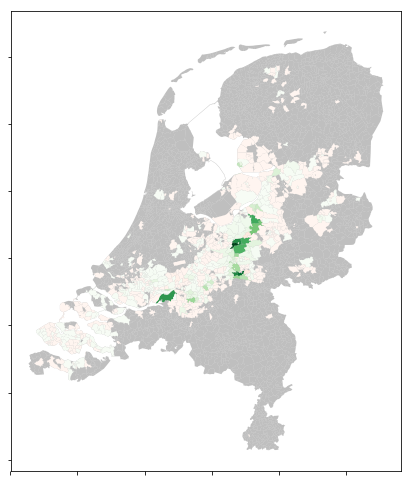

In [41]:
PC_Cases_NP, pc4shapes_NP = plot_resmap(loaded_cons_pc4, loaded_seeds_pc4)

/Users/LAPT0084/anaconda/lib/python2.7/site-packages/ipykernel_launcher.py:43: FutureWarning: convert_objects is deprecated.  To re-infer data dtypes for object columns, use DataFrame.infer_objects()
For all other conversions use the data-type specific converters pd.to_datetime, pd.to_timedelta and pd.to_numeric.
/Users/LAPT0084/anaconda/lib/python2.7/site-packages/ipykernel_launcher.py:47: FutureWarning: convert_objects is deprecated.  To re-infer data dtypes for object columns, use DataFrame.infer_objects()
For all other conversions use the data-type specific converters pd.to_datetime, pd.to_timedelta and pd.to_numeric.
/Users/LAPT0084/anaconda/lib/python2.7/site-packages/ipykernel_launcher.py:51: FutureWarning: convert_objects is deprecated.  To re-infer data dtypes for object columns, use DataFrame.infer_objects()
For all other conversions use the data-type specific converters pd.to_datetime, pd.to_timedelta and pd.to_numeric.
plotting.py:704: RuntimeWarning: divide by zero encount

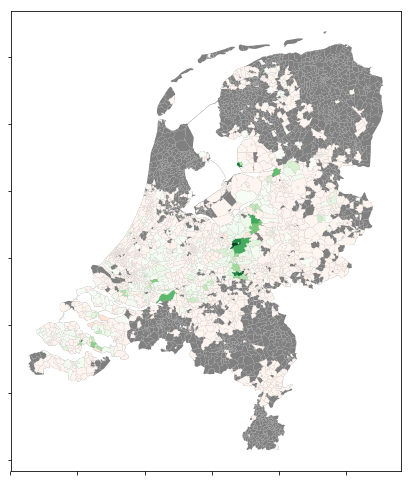

In [20]:
PC_Cases_NS, pc4shapes_NS = plot_resmap(loaded_cons, loaded_seeds)

In [27]:
loaded_cons[2]

['30TF00',
 '04UB00',
 '09JI00',
 '07JN00',
 '03BI00',
 '29TM00',
 '00WH01',
 '00WH00',
 '23EN00',
 '19VI00',
 '06NR00',
 '06EA00',
 '08AV00',
 '03LQ00',
 '08XJ00',
 '02EA05',
 '02EA02',
 '02EA03',
 '02EA00',
 '27RP00',
 '00EI00',
 '26NU00',
 '04UI00',
 '12ZW00',
 '07IA00',
 '03YZ00',
 '03OJ00',
 '10NC00',
 '08JL00',
 '03YY00',
 '23WR00',
 '04NO00',
 '15BW00',
 '28CG00',
 '06FI00',
 '07PE00',
 '23VL03',
 '23VL02',
 '06JV00',
 '06YK00',
 '04EW00',
 '06KQ00',
 '03WY00',
 '03HE00',
 '11VO00',
 '00EM00',
 '26NC01',
 '26NC00',
 '23UX00',
 '00IM00',
 '03RQ00',
 '04SG00',
 '03OA00',
 '07CO00',
 '07MF00',
 '19VR00',
 '04CN00',
 '04LD00',
 '23UE00',
 '07OK00',
 '03RK00',
 '08BF00',
 '18JG00',
 '07ZU00',
 '14ZD00',
 '21QN00',
 '08RK00',
 '04AM00',
 '07KY00',
 '06DY00',
 '24DF00',
 '09TE00',
 '06WX00',
 '03HP00',
 '03HB00',
 '03JY06',
 '23DU00',
 '03JY02',
 '03JY03',
 '03JY00',
 '03JY01',
 '07OX00',
 '23VL00',
 '06NX00',
 '07NE00',
 '04VL00',
 '00PG00',
 '19RJ00',
 '19TB00',
 '00PG03',
 '07KB00',

In [41]:
print sum(pc4shapes_NS['mod'].dropna())
print sum(pc4shapes_SS['mod'].dropna())
print sum(pc4shapes_NP['mod'].dropna())

NameError: name 'pc4shapes_NS' is not defined

In [536]:
OBS = [sum(PC_Cases_NS['cases_' + str(c)]) for c in range(1,1001)]

In [541]:
OBS = [sum(PC_Cases_NS['cases_' + str(c)]) for c in range(1,1001)]
print np.mean(OBS)
print st.scoreatpercentile(OBS, 95)
print st.scoreatpercentile(OBS, 5)

28576.090974316136
29078.739596440613
28022.852344478746


In [543]:
OBS = [sum(PC_Cases_SS['cases_' + str(c)]) for c in range(1,900)]
print np.mean(OBS)
print st.scoreatpercentile(OBS, 95)
print st.scoreatpercentile(OBS, 5)

67.30361954946055
163.44513433758613
9.579475405400183


In [545]:
OBS = [sum(PC_Cases_NP['cases_' + str(c)]) for c in range(1,88)]
print np.mean(OBS)
print st.scoreatpercentile(OBS, 95)
print st.scoreatpercentile(OBS, 5)

9093.229115233464
18209.41206901313
420.1831662904119


In [53]:
rocs_SS = pl.roc_values_weighted(PC_Cases_SS,935)
ssvals_SS = np.array(rocs_SS)[:,[0,2]].T

rocs_NP = pl.roc_values_weighted(PC_Cases_NP,87)
ssvals_NP = np.array(rocs_NP)[:,[0,2]].T

rocs_NS = pl.roc_values_weighted(PC_Cases_NS,1000)
ssvals_NS = np.array(rocs_NS)[:,[0,2]].T

NameError: name 'PC_Cases_SS' is not defined

In [676]:
rocsuw_SS = pl.roc_values(PC_Cases_SS,0,935 )
ssvalsuw_SS = np.array(rocsuw_SS)[:,[0,2]].T

rocsuw_NP = pl.roc_values(PC_Cases_NP,0,87)
ssvalsuw_NP = np.array(rocsuw_NP)[:,[0,2]].T

rocsuw_NS = pl.roc_values(PC_Cases_NS,0,1000)
ssvalsuw_NS = np.array(rocsuw_NS)[:,[0,2]].T

([<matplotlib.axis.XTick at 0x7eed20d90>,
 <a list of 3 Text xticklabel objects>)

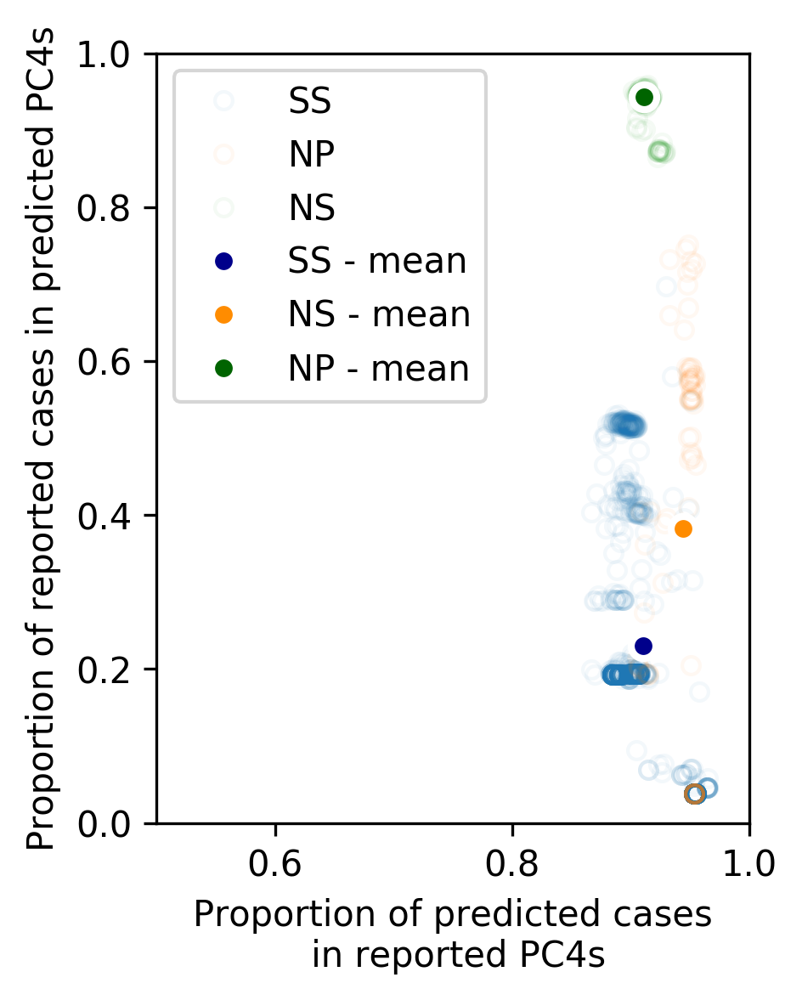

In [802]:
fig = plt.figure(figsize=[3,4], dpi=300)
plt.plot(ssvals_SS[1], ssvals_SS[0], 'o', ms=5, alpha=0.05, mfc='none')
plt.plot(ssvals_NP[1], ssvals_NP[0], 'o', ms=5, alpha=0.05, mfc='none')
plt.plot(ssvals_NS[1], ssvals_NS[0], 'o', ms=5, alpha=0.05, mfc='none')


plt.plot(np.mean(ssvals_SS[1]), np.mean(ssvals_SS[0]), 'o', ms=7, alpha=1, mec='white', mew=2, mfc='DarkBlue')
plt.plot(np.mean(ssvals_NP[1]), np.mean(ssvals_NP[0]), 'o', ms=7, alpha=1, mec='white', mew=2, mfc='DarkOrange')
plt.plot(np.mean(ssvals_NS[1]), np.mean(ssvals_NS[0]), 'o', ms=7, alpha=1, mec='white', mew=2, mfc='DarkGreen')



plt.legend(['SS', 'NP', 
            'NS', 'SS - mean', 
            'NS - mean', 'NP - mean'])

plt.ylabel('Proportion of reported cases in predicted PC4s')
plt.xlabel('Proportion of predicted cases\n in reported PC4s')


plt.xlim([0.5,1])
plt.ylim([0,1])
plt.xticks(np.arange(0.6,1.2, 0.2))

([<matplotlib.axis.XTick at 0x58b753f90>,
 <a list of 6 Text xticklabel objects>)

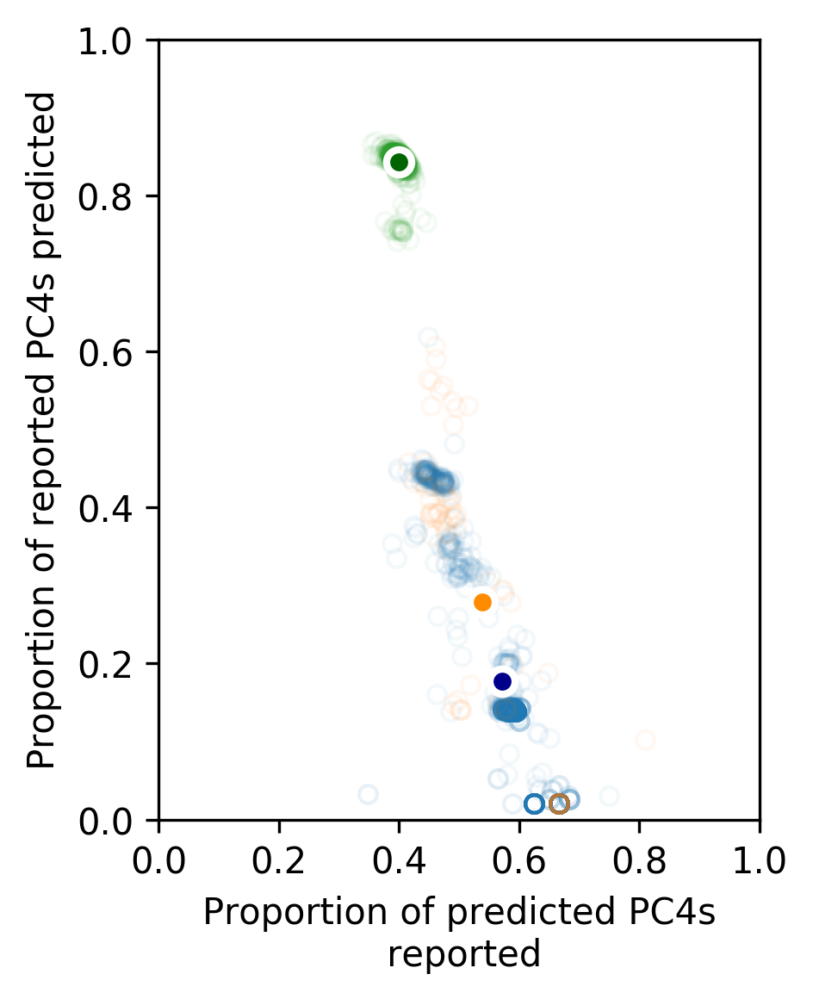

In [686]:
fig = plt.figure(figsize=[3,4], dpi=300)
plt.plot(ssvalsuw_SS[1], ssvalsuw_SS[0], 'o', ms=5, alpha=0.05, mfc='none')
plt.plot(ssvalsuw_NP[1], ssvalsuw_NP[0], 'o', ms=5, alpha=0.05, mfc='none')
plt.plot(ssvalsuw_NS[1], ssvalsuw_NS[0], 'o', ms=5, alpha=0.05, mfc='none')

plt.plot(np.mean(ssvalsuw_SS[1]), np.mean(ssvalsuw_SS[0]), 'o', ms=7, alpha=1, mec='white', mew=2, mfc='DarkBlue')
plt.plot(np.mean(ssvalsuw_NP[1]), np.mean(ssvalsuw_NP[0]), 'o', ms=7, alpha=1, mec='white', mew=2, mfc='DarkOrange')
plt.plot(np.mean(ssvalsuw_NS[1]), np.mean(ssvalsuw_NS[0]), 'o', ms=7, alpha=1, mec='white', mew=2, mfc='DarkGreen')


#plt.legend(['SS', 'NP', 
            #'NS', 'SS - mean', 
            #'NS - mean', 'NP - mean'])

plt.ylabel('Proportion of reported PC4s predicted')
plt.xlabel('Proportion of predicted PC4s\n reported')





plt.xlim([0.,1])
plt.ylim([0,1])
plt.xticks(np.arange(0,1.2, 0.2))

([<matplotlib.axis.XTick at 0x58a75d650>,
 <a list of 3 Text xticklabel objects>)

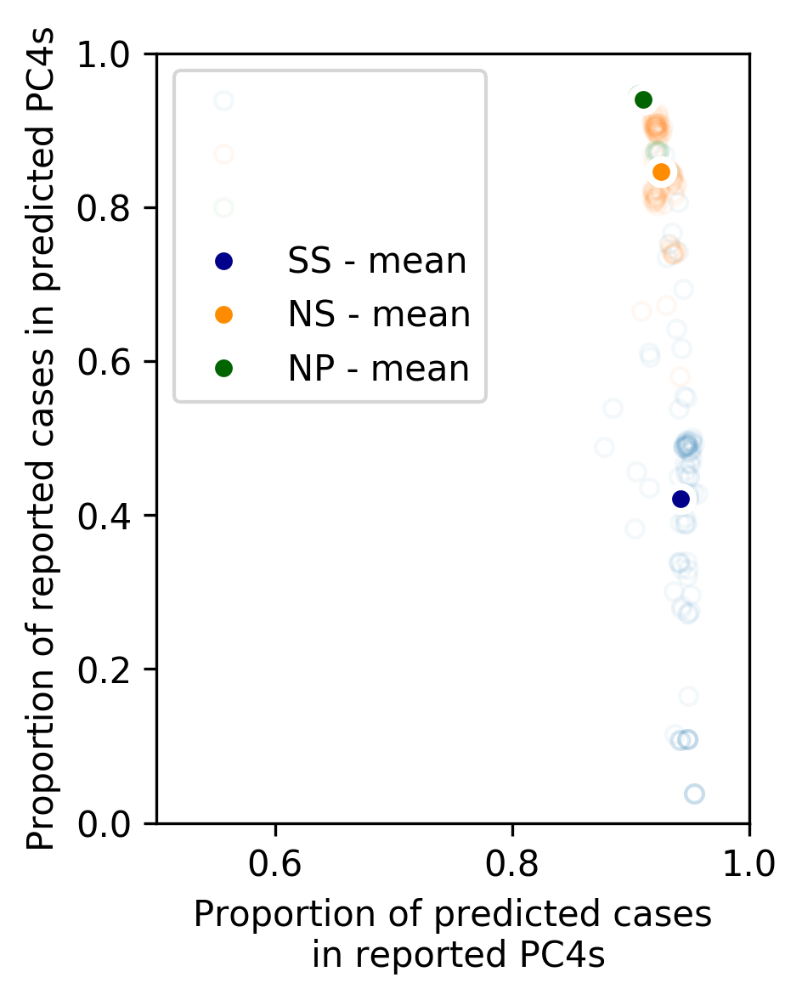

In [721]:
fig = plt.figure(figsize=[3,4], dpi=300)
plt.plot(ssvals_11[1], ssvals_11[0], 'o', ms=5, alpha=0.05, mfc='none')
plt.plot(ssvals_12[1], ssvals_12[0], 'o', ms=5, alpha=0.05, mfc='none')
plt.plot(ssvals_14[1], ssvals_14[0], 'o', ms=5, alpha=0.05, mfc='none')


plt.plot(np.mean(ssvals_11[1]), np.mean(ssvals_11[0]), 'o', ms=7, alpha=1, mec='white', mew=2, mfc='DarkBlue')
plt.plot(np.mean(ssvals_12[1]), np.mean(ssvals_12[0]), 'o', ms=7, alpha=1, mec='white', mew=2, mfc='DarkOrange')
plt.plot(np.mean(ssvals_14[1]), np.mean(ssvals_14[0]), 'o', ms=7, alpha=1, mec='white', mew=2, mfc='DarkGreen')



plt.legend(['', '', 
            '', 'SS - mean', 
            'NS - mean', 'NP - mean'])

plt.ylabel('Proportion of reported cases in predicted PC4s')
plt.xlabel('Proportion of predicted cases\n in reported PC4s')


plt.xlim([0.5,1])
plt.ylim([0,1])
plt.xticks(np.arange(0.6,1.2, 0.2))

In [687]:
print np.mean(ssvalsuw_SS[1]), np.mean(ssvalsuw_SS[0])
print np.mean(ssvalsuw_NP[1]), np.mean(ssvalsuw_NP[0])
print np.mean(ssvalsuw_NS[1]), np.mean(ssvalsuw_NS[0])


0.5721016542829015 0.1776539312329532
0.5390623797774534 0.27893181923094673
0.3993415954542846 0.843339357429719


In [712]:
print np.mean(ssvals_SS[1]), np.mean(ssvals_SS[0])
print np.mean(ssvals_NP[1]), np.mean(ssvals_NP[0])
print np.mean(ssvals_NS[1]), np.mean(ssvals_NS[0])
print np.mean(ssvals_14[1]), np.mean(ssvals_14[0])

0.9106436762094368 0.2305735789265201
0.9446496546523688 0.3830395913154532
0.9115669685288117 0.9429140740740718
0.9108281511527341 0.9400888888888866


In [44]:
locs = np.where(np.array(spatial_seeds) == "04CN00")[0]


In [38]:
import plotting as pl

In [48]:
[t  for t in transnet.nodes if t  in np.array(n)]
np.array(n)

array(['05WV00', '03ZE00', '00CB01', '07AL00'], 
      dtype='|S6')

In [49]:
res_array = np.array([[ t  in np.array(n)  for t in transnet.nodes] for n in  np.array(loaded_cons)[locs]])*1.


In [805]:
vacc_dict_sample['sample 3']['00AH00']


0.9646502289660229

In [50]:
PC_Cases = calculate_pc4_risk(res_array,vacc_dict_sample['sample 0'], transnet.nodes)


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/ipykernel_launcher.py:43: FutureWarning: convert_objects is deprecated.  To re-infer data dtypes for object columns, use DataFrame.infer_objects()
For all other conversions use the data-type specific converters pd.to_datetime, pd.to_timedelta and pd.to_numeric.
/Users/LAPT0084/anaconda/lib/python2.7/site-packages/ipykernel_launcher.py:47: FutureWarning: convert_objects is deprecated.  To re-infer data dtypes for object columns, use DataFrame.infer_objects()
For all other conversions use the data-type specific converters pd.to_datetime, pd.to_timedelta and pd.to_numeric.
/Users/LAPT0084/anaconda/lib/python2.7/site-packages/ipykernel_launcher.py:51: FutureWarning: convert_objects is deprecated.  To re-infer data dtypes for object columns, use DataFrame.infer_objects()
For all other conversions use the data-type specific converters pd.to_datetime, pd.to_timedelta and pd.to_numeric.


In [51]:
pc4_shapes = pl.roc_map(PC_Cases)


plotting.py:704: RuntimeWarning: divide by zero encountered in log
  pc4shapes['logmod'] = np.log(pc4shapes['mod'])
plotting.py:704: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  pc4shapes['logmod'] = np.log(pc4shapes['mod'])
plotting.py:705: RuntimeWarning: divide by zero encountered in log
  pc4shapes['logcount'] = np.log(pc4shapes['Count'])
plotting.py:705: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  pc4shapes['logcount'] = np.log(pc4shapes['Count'])


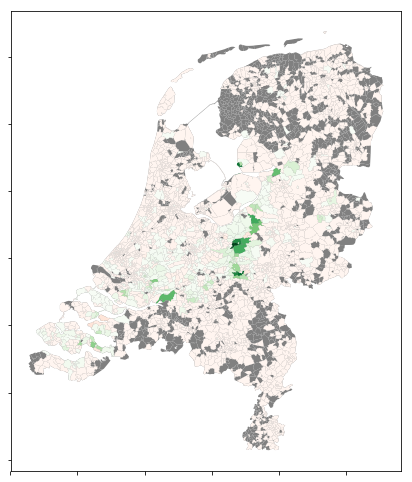

In [52]:
pl.plot_rocmap(pc4_shapes.dropna(subset=['Shape_Area']))


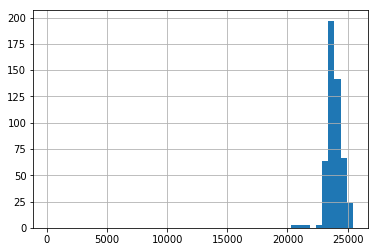

In [593]:
FS_df.query('Seed == "03LQ00"').children.hist()

array([<matplotlib.axes._subplots.AxesSubplot object at 0x49cdae0d0>,
      dtype=object)

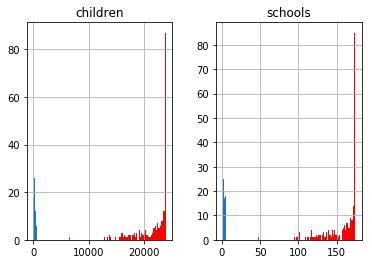

In [673]:
ax = FS_df.groupby('Seed').mean().query('Seed in @Reformed_BRIN').hist(bins=50, color='r')
FS_df.groupby('Seed').mean().query('Seed in @Anthro_BRIN').hist(bins=50, ax=ax)

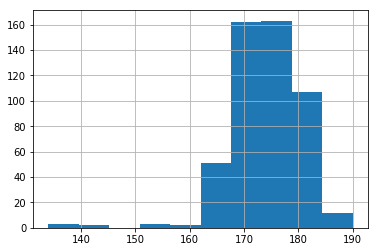

In [594]:
FS_df.query('Seed == "03LQ00"').schools.hist()

In [579]:
vacc_size_FS_spa = pd.concat([vacc_frame[['median', 'p25', 'p75']], FS_df_spat.groupby('Seed').sum()/1000.], axis=1)
vacc_size_FS_net = pd.concat([vacc_frame[['median', 'p25', 'p75']], FS_df_net.groupby('Seed').sum()/1000.], axis=1)
vacc_size_FS_yso = pd.concat([vacc_frame[['median', 'p25', 'p75']], FS_df_yso.query('vacc == @ys').groupby('Seed').sum()/1000.], axis=1)

/Users/LAPT0084/anaconda/lib/python2.7/site-packages/ipykernel/__main__.py:1: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  if __name__ == '__main__':
/Users/LAPT0084/anaconda/lib/python2.7/site-packages/ipykernel/__main__.py:2: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  from ipykernel import kernelapp as app
/Users/LAPT0084/anaconda/lib/python2.7/site-packages/ipykernel/__main__.py:3: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=

In [568]:
FS_df_net['vacc'] = [v.replace('_', '') for v in FS_df_net.vacc]

In [587]:
FS_df_yso.query('Seed in @Reformed_BRIN and vacc == "11"').median()

schools       167.000000
children    22767.297415
dtype: float64

In [480]:
vacc_size_seed = pd.concat([vacc_frame[['median', 'p25', 'p75']], vacc_df_s.groupby('Seed').sum()/1000.], axis=1)

/Users/LAPT0084/anaconda/lib/python2.7/site-packages/ipykernel/__main__.py:1: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  if __name__ == '__main__':


In [138]:
def plot_schools(vacc_size_FS):
    fig=plt.figure(dpi=300, figsize=[5,3])
    ax = vacc_size_FS.query('index in @Reformed_BRIN').plot('median', 'schools', kind='scatter', color='r', ax=fig.gca(), alpha=0.5)
    vacc_size_FS.query('index in @Anthro_BRIN').plot('median', 'schools', kind='scatter', color='Teal', ax=ax, alpha=0.5)
    vacc_size_FS.query('index not in @Anthro_BRIN and index not in @Reformed_BRIN').plot('median', 'schools', kind='scatter', color='Grey', ax=ax, alpha=0.5)

    #plt.vlines(x=vacc_size_1k['median'], ymin=vacc_size_1k['Mean FS'] - vacc_size_1k['p25 FS'], ymax=vacc_size_1k['Mean FS'] + vacc_size_1k['p75 FS'])

    #ax.set_yscale('log')
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    ax.set_ylabel('Mean number of schools infected')
    ax.set_xlabel('Median vaccination uptake')


In [139]:
def plot_children(vacc_size_FS):
    fig=plt.figure(dpi=300, figsize=[5,3])
    ax = vacc_size_FS.query('index in @Reformed_BRIN').plot('median', 'children', kind='scatter', color='r', ax=fig.gca(), alpha=0.5)
    vacc_size_FS.query('index in @Anthro_BRIN').plot('median', 'children', kind='scatter', color='Teal', ax=ax, alpha=0.5)
    vacc_size_FS.query('index not in @Anthro_BRIN and index not in @Reformed_BRIN').plot('median', 'children', kind='scatter', color='Grey', ax=ax, alpha=0.5)

    #plt.vlines(x=vacc_size_1k['median'], ymin=vacc_size_1k['Mean FS'] - vacc_size_1k['p25 FS'], ymax=vacc_size_1k['Mean FS'] + vacc_size_1k['p75 FS'])

    #ax.set_yscale('log')
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    ax.set_ylabel('Mean number of children infected')
    ax.set_xlabel('Median vaccination uptake')

In [505]:
def plot_seeds(vacc_size_FS):
    fig=plt.figure(dpi=300, figsize=[5,3])
    ax = vacc_size_FS.query('index in @Reformed_BRIN').plot('median', 'proportion of seeds', kind='scatter', color='r', ax=fig.gca(), alpha=0.5)
    vacc_size_FS.query('index in @Anthro_BRIN').plot('median', 'proportion of seeds', kind='scatter', color='Teal', ax=ax, alpha=0.5)
    vacc_size_FS.query('index not in @Anthro_BRIN and index not in @Reformed_BRIN').plot('median', 'proportion of seeds', kind='scatter', color='Grey', ax=ax, alpha=0.5)

    #plt.vlines(x=vacc_size_1k['median'], ymin=vacc_size_1k['Mean FS'] - vacc_size_1k['p25 FS'], ymax=vacc_size_1k['Mean FS'] + vacc_size_1k['p75 FS'])

    #ax.set_yscale('log')
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    ax.set_ylabel('Mean proportion of possible seeds')
    ax.set_xlabel('Median vaccination uptake')

median                 0.866247
p25                    0.834152
p75                    0.910065
schools                5.706000
proportion of seeds    0.011067
dtype: float64
median                 0.733744
p25                    0.653884
p75                    0.803475
schools                1.890556
proportion of seeds    0.003229
dtype: float64
median                   0.950065
p25                      0.915739
p75                      0.972610
schools                174.542000
proportion of seeds      0.398577
dtype: float64
median                   0.603637
p25                      0.496977
p75                      0.699304
schools                142.859111
proportion of seeds      0.325762
dtype: float64


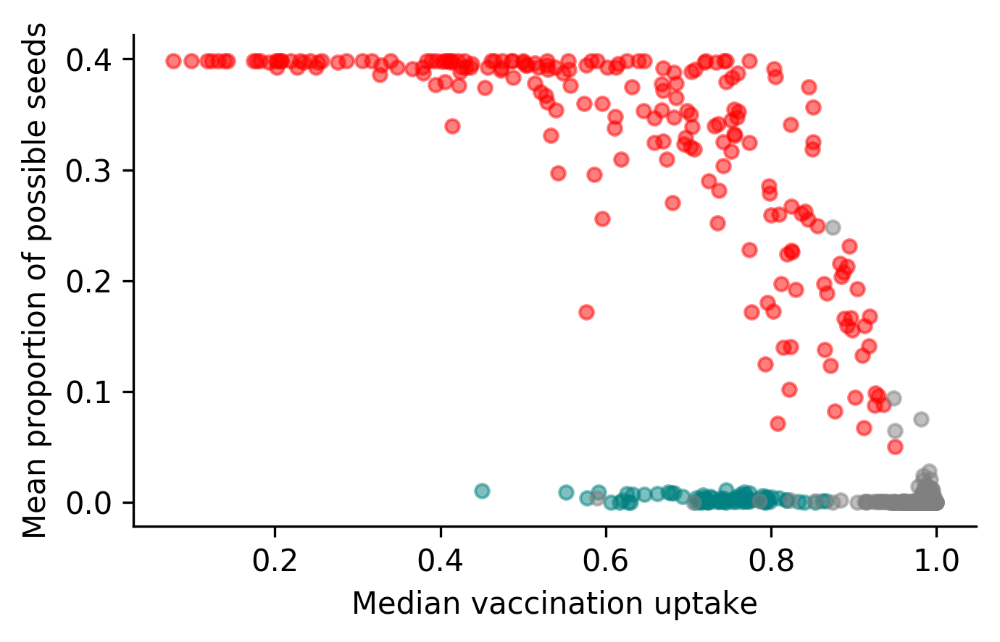

In [523]:
plot_seeds(vacc_size_seed)

print vacc_size_seed.query('index in @Anthro_BRIN').max()
print vacc_size_seed.query('index in @Anthro_BRIN').mean()
print vacc_size_seed.query('index in @Reformed_BRIN').max()
print vacc_size_seed.query('index in @Reformed_BRIN').mean()

In [486]:
vacc_size_both = pd.concat([FS_df_net.groupby('Seed').sum()/1000., vacc_df_s.groupby('Seed').sum()/1000.], axis=1)

/Users/LAPT0084/anaconda/lib/python2.7/site-packages/ipykernel/__main__.py:1: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  if __name__ == '__main__':


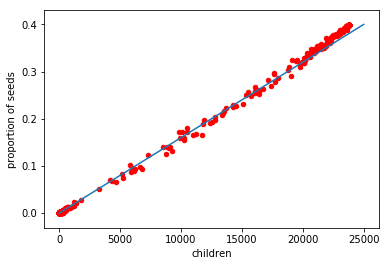

In [507]:
vacc_size_both.dropna().plot('children', 'proportion of seeds', kind='scatter', color='r')
plt.plot([0,25000], [0,0.4] )

24.713

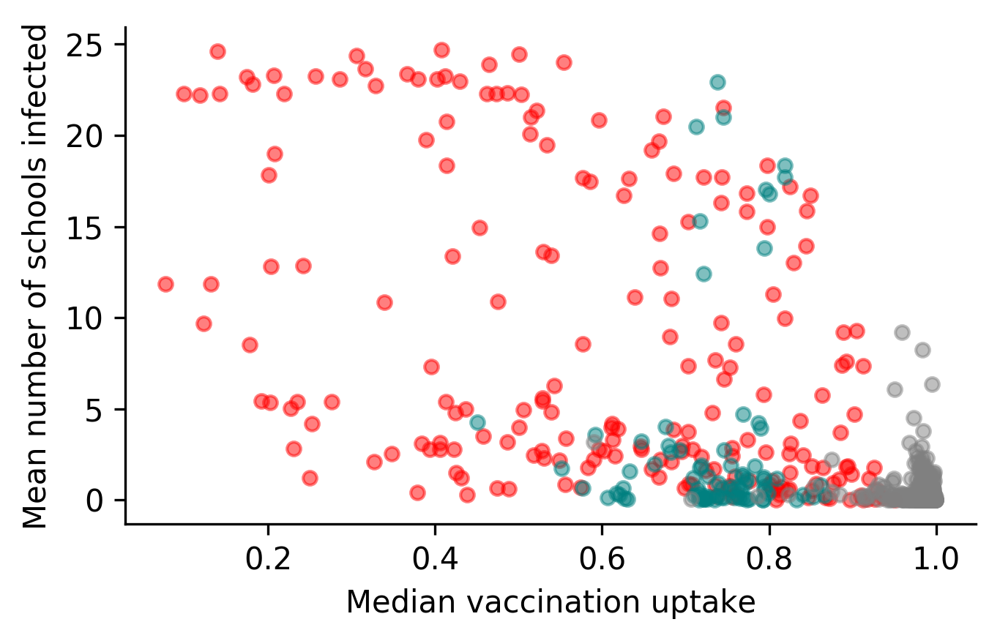

In [509]:
plot_schools(vacc_size_FS_spa)
vacc_size_FS_spa.schools.max()

median        0.866247
p25           0.834152
p75           0.910065
schools       5.377000
children    615.520621
dtype: float64
median      0.450661
p25         0.291091
p75         0.597869
schools     0.024000
children    1.190203
dtype: float64


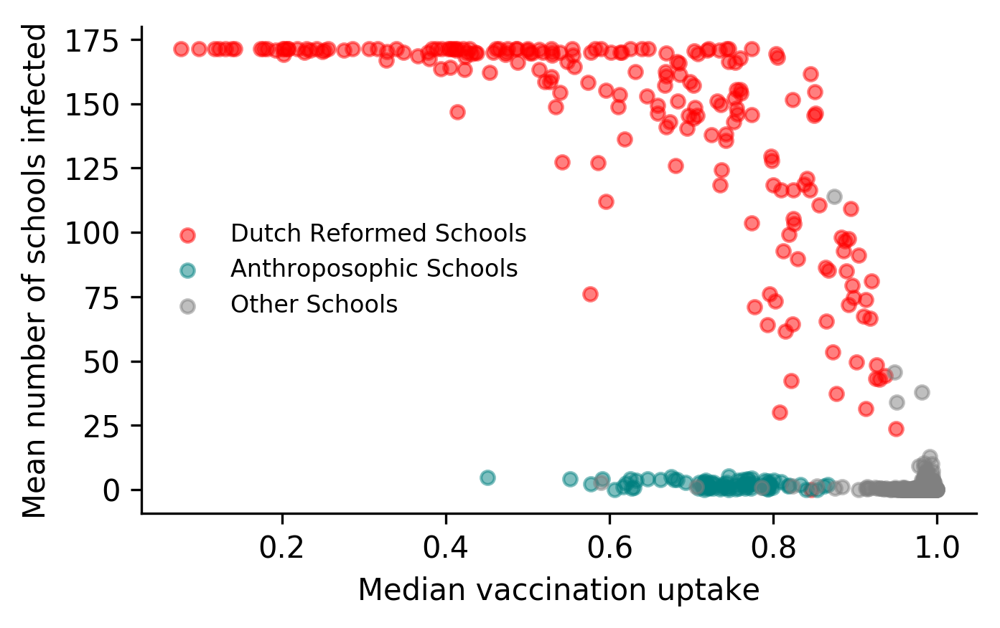

In [562]:
plot_schools(vacc_size_FS_net)
plt.legend(['Dutch Reformed Schools', 'Anthroposophic Schools', 'Other Schools'], fontsize=8, frameon=False)
vacc_size_FS_net.schools.max()
print vacc_size_FS_net.query('index in @Anthro_BRIN').max()
print vacc_size_FS_net.query('index in @Anthro_BRIN').min()

median        0.866247
p25           0.834152
p75           0.910065
schools       5.377000
children    615.520621
dtype: float64
median      0.450661
p25         0.291091
p75         0.597869
schools     0.024000
children    1.190203
dtype: float64


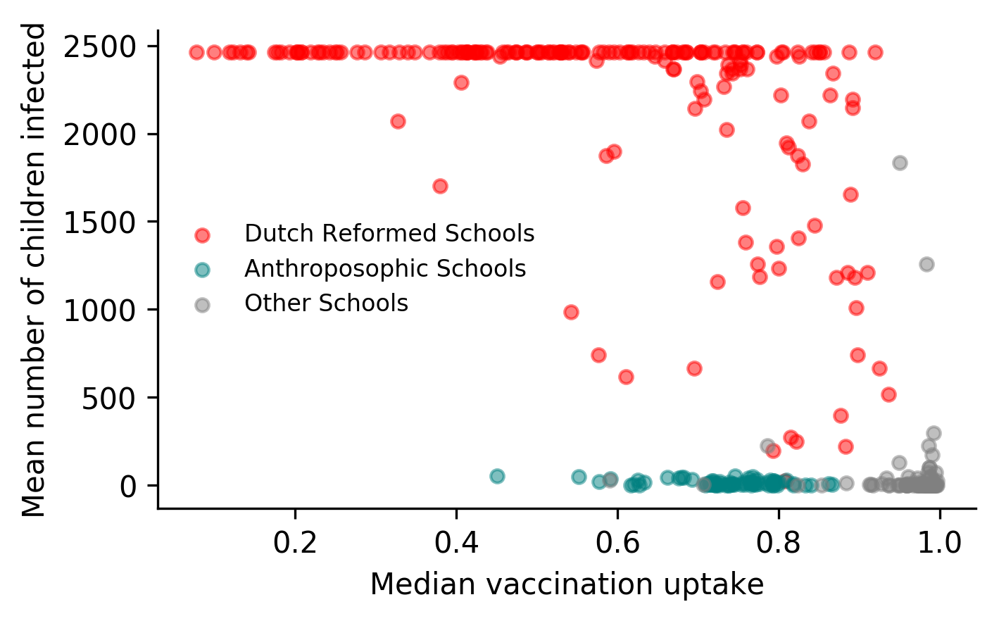

In [560]:
plot_children(vacc_size_FS_yso)
plt.legend(['Dutch Reformed Schools', 'Anthroposophic Schools', 'Other Schools'], fontsize=8, frameon=False)
vacc_size_FS_net.schools.max()
print vacc_size_FS_net.query('index in @Anthro_BRIN').max()
print vacc_size_FS_net.query('index in @Anthro_BRIN').min()

median         0.866247
p25            0.834152
p75            0.910065
schools       22.925000
children    4916.023142
dtype: float64
median      0.450661
p25         0.291091
p75         0.597869
schools     0.007000
children    0.073173
dtype: float64


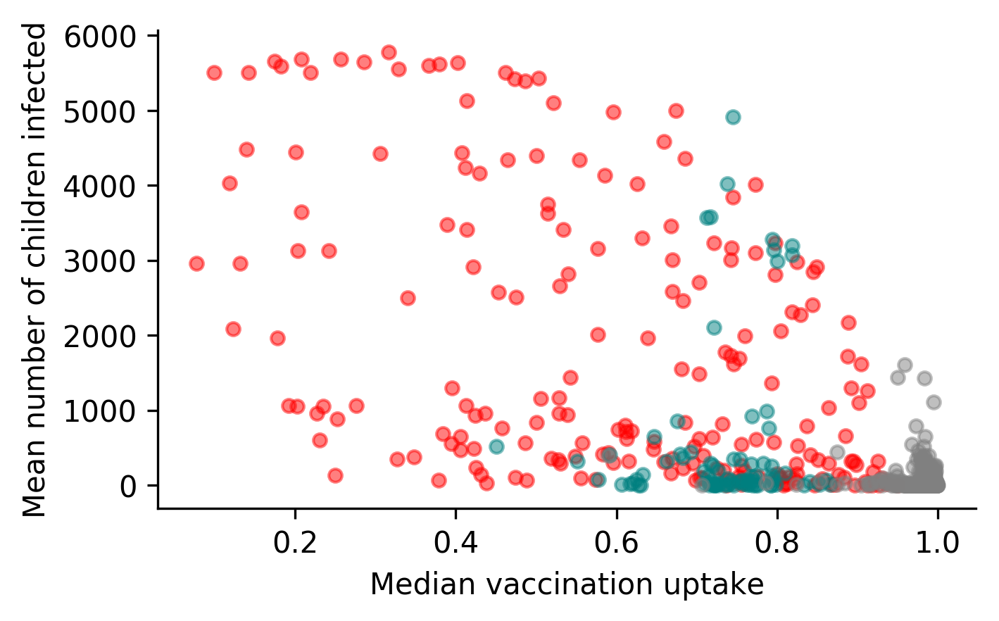

In [517]:
plot_children(vacc_size_FS_spa)
vacc_size_FS_spa.children.max()
print vacc_size_FS_spa.query('index in @Anthro_BRIN').max()
print vacc_size_FS_spa.query('index in @Anthro_BRIN').min()

23766.28720031461

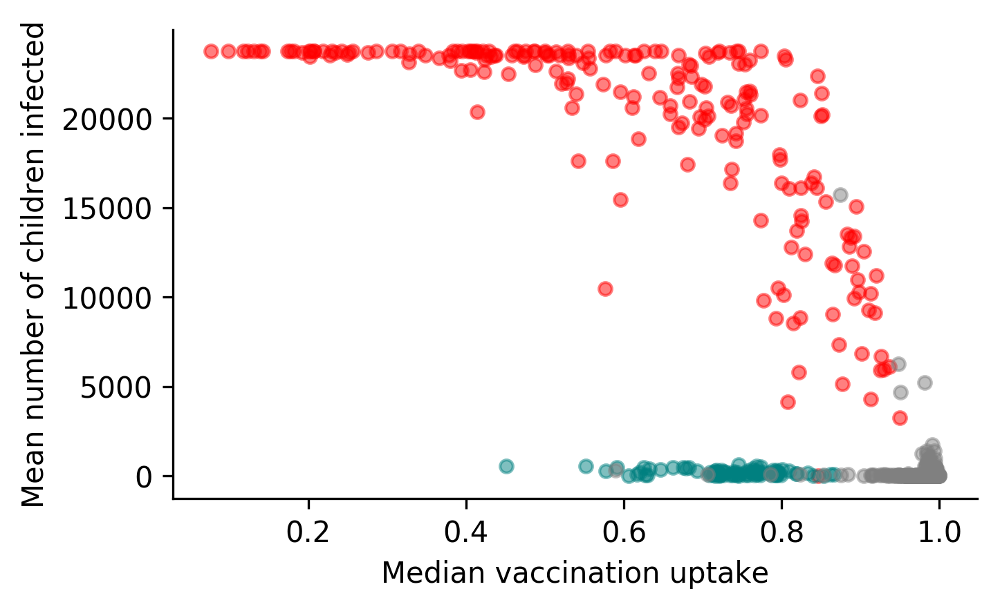

In [580]:
plot_children(vacc_size_FS_net)
vacc_size_FS_net.children.max()

In [632]:
sch_vacc = pd.DataFrame(pd.concat([schools_data.set_index('BRIN'), vacc_size_FS], axis=1))

/Users/LAPT0084/anaconda/lib/python2.7/site-packages/ipykernel/__main__.py:1: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  if __name__ == '__main__':


In [621]:
degree_dict = transnet.trans_net.degree()
wei_degree_dict = transnet.data_net.degree(weight='weight')
wei_between_dict = nx.centrality.betweenness_centrality(transnet.data_net.subgraph(nbunch=sch_vacc.query('median < 0.9').index),weight='inv_weight')
wei_eigen_dict = nx.centrality.eigenvector_centrality(transnet.data_net.subgraph(nbunch=sch_vacc.query('median < 0.9').index),weight='inv_weight')

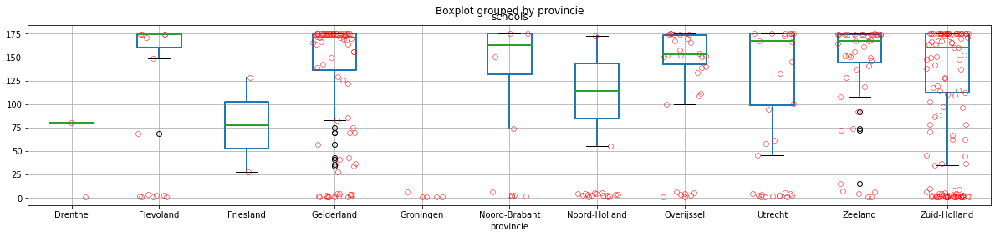

In [653]:
boxprops = dict(linewidth=2, color='k')
whiskerprops = dict(linewidth=2, color='k')
medianprops = dict(linewidth=2, color='k')
sch_vacc.query('Denomination == "Reformatorisch"').boxplot('schools', by='provincie', figsize=[20,4],boxprops=boxprops, whiskerprops=whiskerprops,medianprops=medianprops )

randomx_list = [[prov, np.random.random(len(sch_vacc.query('provincie == @prov and schools>1')))] for prov in np.sort(sch_vacc.query('Denomination == "Reformatorisch"').provincie.unique())]

for i , rand in enumerate(randomx_list):
    plt.plot(0.75 + i + np.array(rand[1]) * 0.5, sch_vacc.query('provincie == @rand[0] and schools>1')['schools'], 
         'o', mec='r', mew=0.5, mfc='none')



In [353]:
np.sort(sch_vacc.query('Denomination == "Reformatorisch"').provincie.unique())

array(['Drenthe', 'Flevoland', 'Friesland', 'Gelderland', 'Groningen',
       'Noord-Brabant', 'Noord-Holland', 'Overijssel', 'Utrecht',
       'Zeeland', 'Zuid-Holland'], dtype=object)

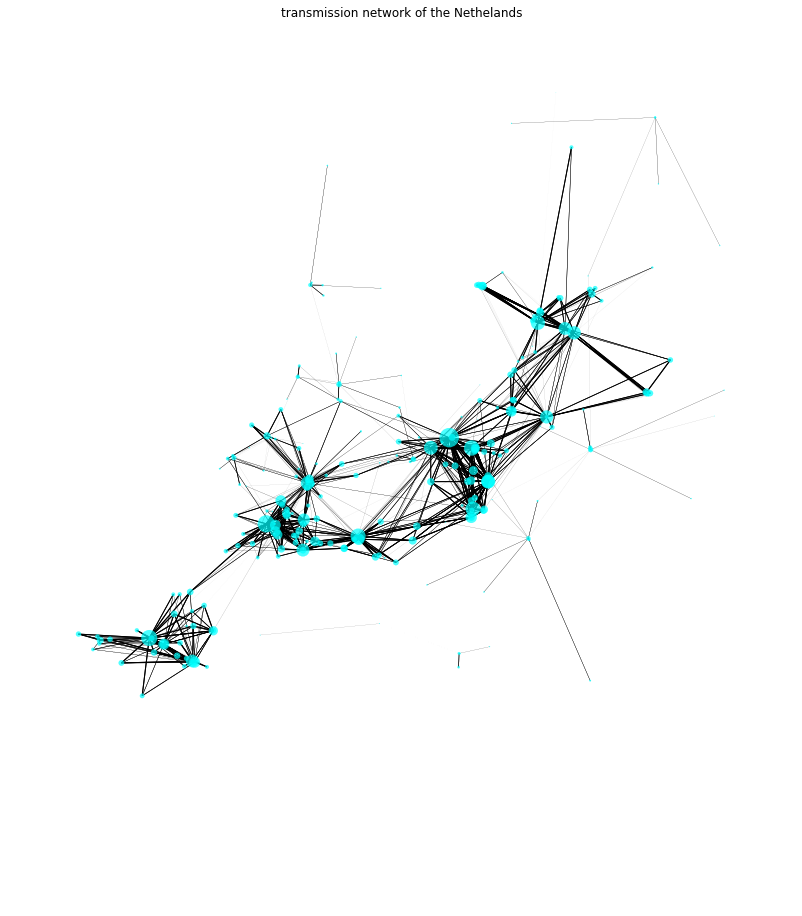

In [358]:
transnet.plot_transnet(transnet.trans_net.subgraph(nbunch=np.intersect1d(transnet.nodes, sch_vacc.query('median < 0.9').index)), pos=transnet.pos_geo)

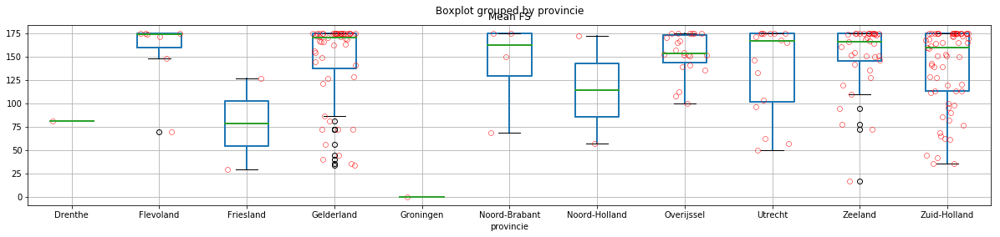

In [365]:
boxprops = dict(linewidth=2, color='k')
whiskerprops = dict(linewidth=2, color='k')
medianprops = dict(linewidth=2, color='k')
sch_vacc.query('Denomination == "Reformatorisch"').boxplot('Mean FS', by='provincie', 
                                                           figsize=[20,4],boxprops=boxprops, 
                                                           whiskerprops=whiskerprops,medianprops=medianprops )

randomx_list = [[prov, np.random.random(len(sch_vacc.query('Denomination == "Reformatorisch" and provincie == @prov')))] for prov in np.sort(sch_vacc.query('Denomination == "Reformatorisch"').provincie.unique())]

for i , rand in enumerate(randomx_list):
    plt.plot(0.75 + i + np.array(rand[1]) * 0.5, sch_vacc.query('Denomination == "Reformatorisch" and provincie == @rand[0]')['Mean FS'], 
         'o', mec='r', mew=0.5, mfc='none')



In [63]:
def find_seed_decendants(seed, amat, nodelist_am):
    seedindex = np.where(nodelist_am==seed)
    zs = np.zeros(len(amat))
    zs[seedindex] = 1.
    just_seed = transnet.create_network_from_transmat(amat * zs, nodelist_am)
    edge_dict_seed = nx.get_edge_attributes(just_seed, 'weight')
    seed_degree = pd.DataFrame.from_dict(just_seed.degree(weight='weight'),orient='index', columns=['degree'])
    seed_nodes = seed_degree.query('degree > 0').index
    
    return just_seed, seed_nodes, edge_dict_seed, seed_degree

def plot_seed_successors2(just_seed_d, just_seed, d_nodes, edge_dict_d, edge_dict_sp, ddictd_, ddictsp_, pos = transnet.pos_geo):
    plt.figure(figsize=[5,7.5], dpi=300)
    jsd = just_seed_d.subgraph(nbunch=np.intersect1d(transnet.nodes, d_nodes))
    nx.draw_networkx_nodes(just_seed, pos=transnet.pos_geo, node_color='grey', node_size=np.array([ddictsp_[n] for n in just_seed.nodes()])/5., nodelist=just_seed.nodes())
    nx.draw_networkx_nodes(jsd, pos=transnet.pos_geo, node_color='r', node_size=np.array([ddictd_[n] for n in jsd.nodes()])/5., nodelist=jsd.nodes())

    nx.draw_networkx_edges(just_seed, pos=transnet.pos_geo, edge_color='Teal', node_color='k', node_size=2., arrows=False, 
    width=np.array([edge_dict_sp[e + (0,)] for e in just_seed.edges()])/20.)

    nx.draw_networkx_edges(jsd, pos=transnet.pos_geo, edge_color='r', node_color='k', 
    node_size=2., arrows=False, width=np.array([edge_dict_d[e + (0,)] for e in jsd.edges()])/200., edgelist=jsd.edges())

    

    plt.xlim([75000, 125000])
    plt.ylim([400000, 500000])
    
def plot_seed_successors(just_seed_d, just_seed, d_nodes, edge_dict_d, edge_dict_sp, ddictd_, ddictsp_, pos = transnet.pos_geo):
    plt.figure(figsize=[5,7.5], dpi=300)
    jsd = just_seed_d.subgraph(nbunch=np.intersect1d(transnet.nodes, d_nodes))
    nx.draw_networkx_nodes(just_seed, pos=transnet.pos_geo, node_color='Teal', node_size=np.array([ddictsp_[n] for n in just_seed.nodes()])/5., nodelist=just_seed.nodes())
    #nx.draw_networkx_nodes(jsd, pos=transnet.pos_geo, node_color='r', node_size=np.array([ddictd_[n] for n in jsd.nodes()])/5., nodelist=jsd.nodes())

    nx.draw_networkx_edges(just_seed, pos=transnet.pos_geo, edge_color='Teal', node_color='k', node_size=2., arrows=False, 
    width=np.array([edge_dict_sp[e + (0,)] for e in just_seed.edges()])/20.)

    #nx.draw_networkx_edges(jsd, pos=transnet.pos_geo, edge_color='r', node_color='k', 
    #node_size=2., arrows=False, width=np.array([edge_dict_d[e + (0,)] for e in jsd.edges()])/200., edgelist=jsd.edges())

    

    plt.xlim([75000, 125000])
    plt.ylim([400000, 500000])

In [48]:
just_seed_d, d_nodes, edge_dict_d, seed_degree_d = find_seed_decendants(seed='03LQ00', amat=transnet.adj_mat_dt, nodelist_am = transnet.nodelist)

In [55]:
adj_mat_spa_all, nodelist, dist_mat = mn.make_random_adjmat(transnet.data_net.subgraph(nbunch=transnet.vacc_dict_samples['sample 0'].keys()), transnet.school_data, transnet.school_data, p=0.65, rule='gauss', sec_pri_only=False)

adj_mat_spa_all = np.nan_to_num(adj_mat_spa_all,0)

adj_mat_spa_all = adj_mat_spa_all*transnet.adj_mat_dt.sum()/adj_mat_spa_all.sum()


8916


In [56]:
adj_mat_spa_ps, nodelist, dist_mat = mn.make_random_adjmat(transnet.data_net.subgraph(nbunch=transnet.vacc_dict_samples['sample 0'].keys()), transnet.school_data, transnet.school_data, p=0.65, rule='gauss', sec_pri_only=True)

adj_mat_spa_ps = np.nan_to_num(adj_mat_spa_ps,0)

adj_mat_spa_ps = adj_mat_spa_ps*transnet.adj_mat_dt.sum()/adj_mat_spa_ps.sum()


8916


make_network.py:173: RuntimeWarning: invalid value encountered in divide
  contact_mat = degmat * deg_scaled_mat_sp/sum(deg_scaled_mat_sp)


In [57]:
just_seed_sp_p, sp_nodes_p, edge_dict_sp_p, seed_degree_sp_p = find_seed_decendants(seed='03LQ00', amat=adj_mat_spa_ps, nodelist_am = nodelist)

In [58]:
just_seed_sp, sp_nodes_p, edge_dict_sp, seed_degree_sp = find_seed_decendants(seed='03LQ00', amat=adj_mat_spa_all, nodelist_am = nodelist)

In [59]:
ddictd = seed_degree_d.to_dict()['degree']
ddictsp = seed_degree_sp.to_dict()['degree']
ddictspp = seed_degree_sp_p.to_dict()['degree']


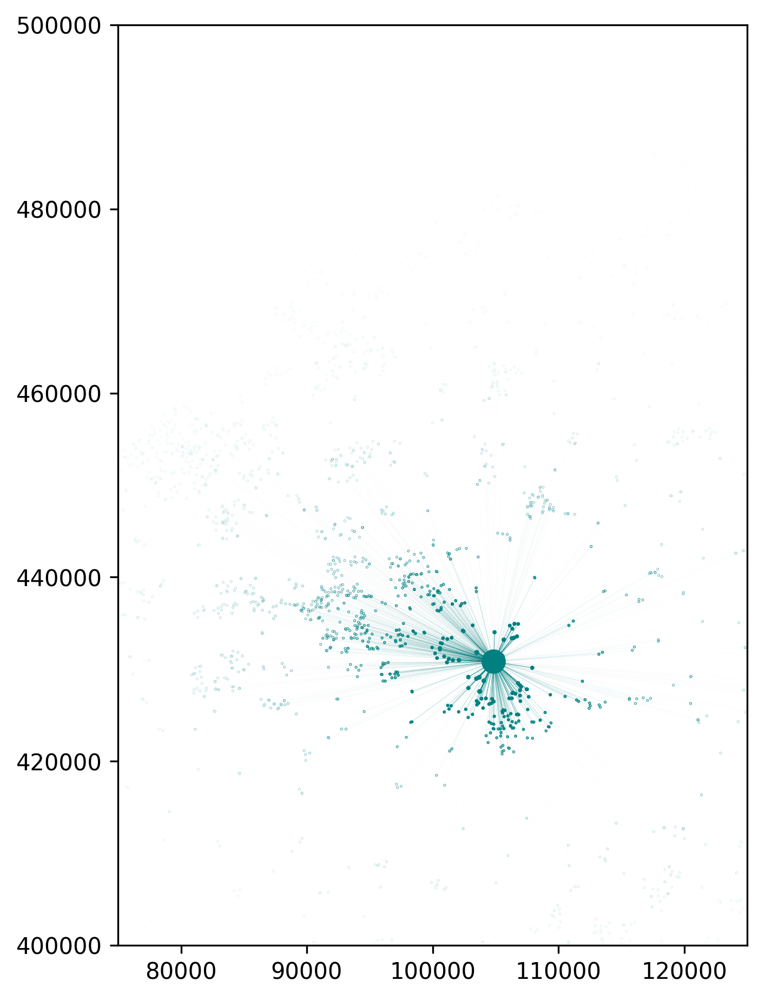

In [64]:
plot_seed_successors(just_seed_d, just_seed_sp, d_nodes, edge_dict_d, edge_dict_sp, ddictd, ddictsp, pos = transnet.pos_geo)

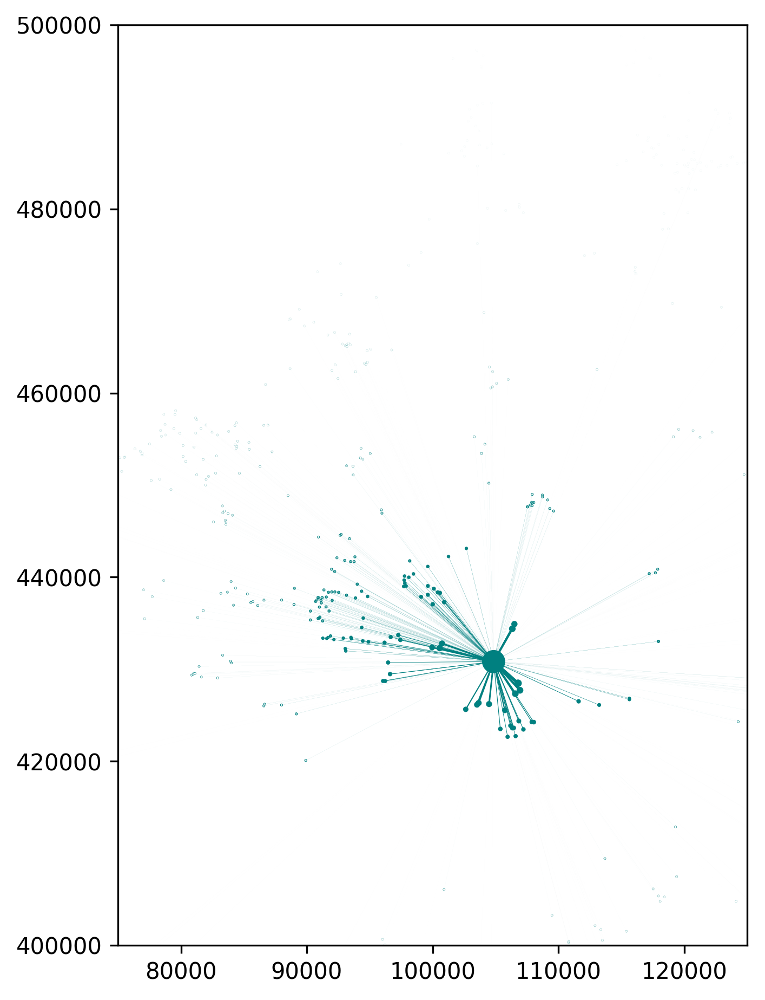

In [65]:
plot_seed_successors(just_seed_d, just_seed_sp_p, d_nodes, edge_dict_d, edge_dict_sp_p, ddictd, ddictspp, pos = transnet.pos_geo)

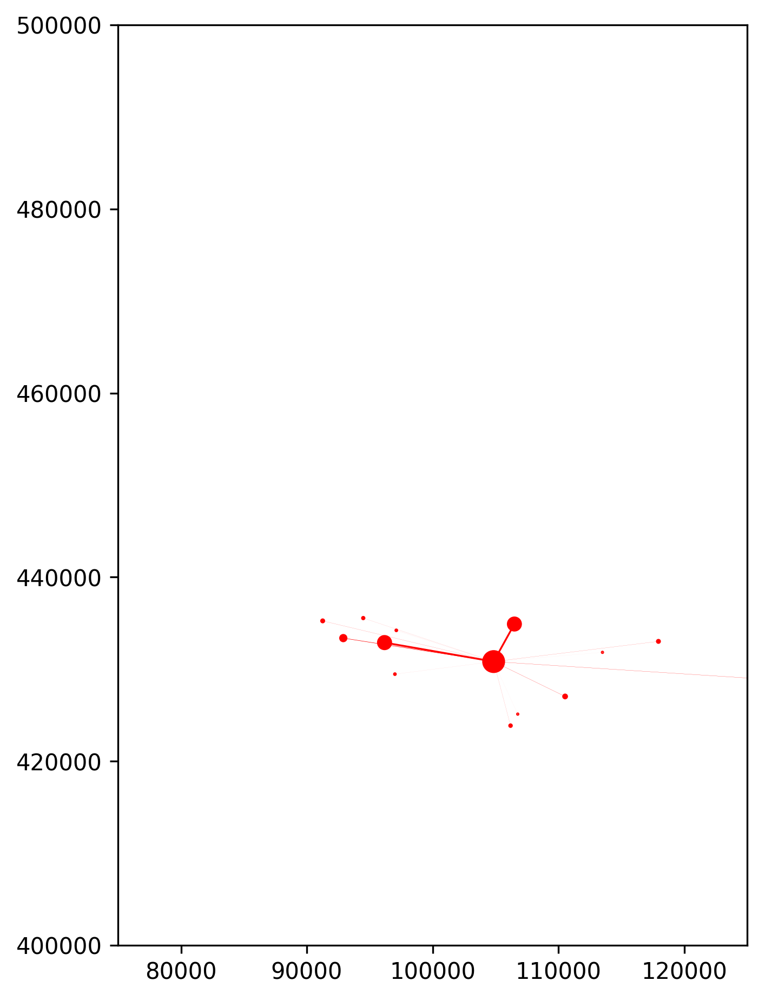

In [62]:
plot_seed_successors(just_seed_d, just_seed_sp_p, d_nodes, edge_dict_d, edge_dict_sp_p, ddictd, ddictspp, pos = transnet.pos_geo)

In [68]:
import make_network as mn
import pickle

In [17]:
def find_FS():
    FS = []
    vacc = transnet.vacc_dict_samples['sample ' + str(v)]
    for i in xrange(len(seeds)):
        #print seed 
        seed = seeds[i]
        cs = [c for c in cons[i] if c in transnet.nodes]
        #print 'calc 1'
        FSs = np.array([FSList[int((1. - vacc[sch])*1000)] for sch in cs])
        #print 'calc 2'
        kidnos = np.array(num_frame.loc[cs].fillna(0).leerlingen)

        #print 'calc 3'
        no_inf = FSs*kidnos

        #print 'calc 4'
        tot_no_inf = no_inf.sum()

        FS.append([seed, 1.*len(cs), tot_no_inf])
    return FS



In [692]:
FS_df_net.to_csv('FS_df_net.csv')


In [693]:
FS_df_spat.to_csv('FS_df_spat.csv')

In [694]:
FS_df_yso.to_csv('FS_df_yso.csv')

In [695]:
FS_df_yso_ps.to_csv('FS_df_yso_ps.csv')

In [54]:
PC_Cases_NP.to_csv('PC_Cases_NP.csv')
PC_Cases_NS.to_csv('PC_Cases_NS.csv')
PC_Cases_SS.to_csv('PC_Cases_SS.csv')
PC_Cases_yso5.to_csv('PC_Cases_yso5.csv')
PC_Cases_yso6.to_csv('PC_Cases_yso6.csv')
PC_Cases_yso7.to_csv('PC_Cases_yso7.csv')
PC_Cases_yso8.to_csv('PC_Cases_yso8.csv')
PC_Cases_yso9.to_csv('PC_Cases_yso9.csv')
PC_Cases_yso10.to_csv('PC_Cases_yso10.csv')
PC_Cases_yso11.to_csv('PC_Cases_yso11.csv')


NameError: name 'PC_Cases_NP' is not defined

In [33]:
import datetimeas dt

SyntaxError: invalid syntax (<ipython-input-33-7a26a0c5ce64>, line 1)